Team Gordon

Student Name	Student Number
 Alisha Sahota	20497348
 Anthony Ramelo	20499391
 Chris Wu	10182394
 Elizabeth Zhang	20161231
 Emily Zhao	10096273
 Sam Hossain	20466500


In [1]:
# ----------------------------
# 1. Import Necessary Libraries
# ----------------------------
import os
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import shap
# Machine Learning Libraries
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.svm import SVR
from sklearn.svm import SVC  # Add this import
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error,
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    roc_curve, classification_report, confusion_matrix)
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, label_binarize  # Imported label_binarize
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, roc_curve, auc
)
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN

import xgboost as xgb
import lightgbm as lgb
import shap
from sklearn.neural_network import MLPRegressor, MLPClassifier
import xgboost as xgb
import lightgbm as lgb

# Resampling Techniques
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN

# Feature Selection
from sklearn.feature_selection import SelectKBest, chi2, RFE

# Model Persistence
import joblib

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# Set Plot Style
sns.set(style='whitegrid')

In [6]:
# ----------------------------
# 2. Define Constants and Paths
# ----------------------------
DATA_FILE_PATH = 'Input/Data 3 - October, 2024.xlsx'  # Update this path as needed
OUTPUT_DIR = 'output_cis'
os.makedirs(OUTPUT_DIR, exist_ok=True)
CURRENT_DATE = datetime.now().strftime('%Y-%m-%d')

# ----------------------------
# 3. Data Loading and Merging
# ----------------------------
print("Loading and merging data...\n")

# Load Monthly Engagement Data
try:
    monthly_engagement = pd.read_excel(DATA_FILE_PATH, sheet_name='Monthly Wellness and Engagement')
    print("Loaded 'Monthly Wellness and Engagement' sheet successfully.")
except Exception as e:
    print(f"Error loading 'Monthly Wellness and Engagement' sheet: {e}")
    raise

# Load Parachute Cross Section Data
try:
    parachute_cross_section = pd.read_excel(DATA_FILE_PATH, sheet_name='Parachute - Cross Section')
    print("Loaded 'Parachute - Cross Section' sheet successfully.")
except Exception as e:
    print(f"Error loading 'Parachute - Cross Section' sheet: {e}")
    raise

# Load TU - Panel Data
try:
    tu_df = pd.read_excel(DATA_FILE_PATH, sheet_name='TU - Panel')
    print("Loaded 'TU - Panel' sheet successfully.")
except Exception as e:
    print(f"Error loading 'TU - Panel' sheet: {e}")
    raise

# Aggregate FICO Scores by 'loan_id'
tu_df = tu_df.groupby('loan_id', as_index=False)['fico_score'].mean()

# Function to Check Missing Values
def check_missing_values(df, df_name):
    missing = df.isnull().sum()
    print(f"\nMissing values in {df_name} dataset:")
    if missing.sum() > 0:
        print(missing[missing > 0])
    else:
        print("No missing values detected.")

# Check for Missing Values
check_missing_values(monthly_engagement, 'Monthly Engagement')
check_missing_values(parachute_cross_section, 'Parachute Cross Section')
check_missing_values(tu_df, 'TU - Panel')

# Handle Missing Values in Monthly Engagement
monthly_engagement['wellness_score'].fillna(monthly_engagement['wellness_score'].mean(), inplace=True)
category_columns = monthly_engagement.select_dtypes(include=['object']).columns
monthly_engagement[category_columns] = monthly_engagement[category_columns].fillna('Unknown')

# Convert Date Columns to Datetime
monthly_engagement['month'] = pd.to_datetime(monthly_engagement['month'], format='%Y-%m', errors='coerce')
parachute_cross_section['Disbursement Date'] = pd.to_datetime(parachute_cross_section['Disbursement Date'], errors='coerce')
parachute_cross_section['Date of Birth'] = pd.to_datetime(parachute_cross_section['Date of Birth'], errors='coerce')

# Rename ID Columns to 'customer_id' for Consistency
monthly_engagement.rename(columns={'loanid': 'customer_id'}, inplace=True)
parachute_cross_section.rename(columns={'ID': 'customer_id'}, inplace=True)
tu_df.rename(columns={'loan_id': 'customer_id'}, inplace=True)

# Modify 'customer_id' Formats
tu_df['customer_id'] = tu_df['customer_id'].astype(str)
parachute_cross_section['customer_id'] = parachute_cross_section['customer_id'].astype(str)
monthly_engagement['customer_id'] = monthly_engagement['customer_id'].astype(str)

# Remove Duplicates
monthly_engagement.drop_duplicates(inplace=True)
parachute_cross_section.drop_duplicates(inplace=True)
tu_df.drop_duplicates(inplace=True)

# Merge Datasets
engagement_cross_section = pd.merge(monthly_engagement, parachute_cross_section, on='customer_id', how='left')
full_data = pd.merge(engagement_cross_section, tu_df, on='customer_id', how='inner')

print("\nMerged Dataset Shape:", full_data.shape)
print("\nMerged Dataset Columns:")
print(full_data.columns.tolist())

# Calculate Customer's Age at Disbursement
full_data['age_at_disbursement'] = (full_data['Disbursement Date'] - full_data['Date of Birth']).dt.days // 365

# Ensure 'Outstanding Balance' and 'Qualified / Verified Income' are Numeric
full_data['Outstanding Balance'] = pd.to_numeric(full_data['Outstanding Balance'], errors='coerce')
full_data['Qualified / Verified\nIncome'] = pd.to_numeric(full_data['Qualified / Verified\nIncome'], errors='coerce')
full_data['Loan_to_Income_Ratio'] = full_data['Loan Amount'] / full_data['Qualified / Verified\nIncome']
full_data['Monthly_Repayment_Burden'] = full_data['Outstanding Balance'] / full_data['Loan Term (Months)']
# Calculate Debt-to-Income Ratio
full_data['debt_to_income_ratio'] = full_data['Outstanding Balance'] / full_data['Qualified / Verified\nIncome']

# Exploratory Data Analysis (EDA)
print("\nSummary Statistics:")
print(full_data.describe())

# Feature Engineering: Engagement Level
conditions = [
    (full_data['activities_count'] <= 5),
    (full_data['activities_count'] > 5) & (full_data['activities_count'] <= 15),
    (full_data['activities_count'] > 15)
]
choices = ['Low', 'Medium', 'High']
full_data['engagement_level'] = np.select(conditions, choices)

# One-Hot Encoding for Categorical Variables
full_data_encoded = pd.get_dummies(full_data, columns=category_columns, drop_first=True)

# Handle Missing Values in New Features
full_data_encoded['dti_missing'] = full_data_encoded['debt_to_income_ratio'].isnull().astype(int)

# Predictive Imputation Using KNN Imputer
imputation_features = [
    'debt_to_income_ratio',
    'Outstanding Balance',
    'Qualified / Verified\nIncome',
    'age_at_disbursement',
    'Financial Literacy Score',
    'Aptitude for change Score',
    # Add other relevant features if available
]
# Ensure all imputation features are present
missing_imputation_features = [feat for feat in imputation_features if feat not in full_data_encoded.columns]
if missing_imputation_features:
    print(f"\nWarning: The following imputation features are missing in the data and will be skipped: {missing_imputation_features}")
    imputation_features = [feat for feat in imputation_features if feat in full_data_encoded.columns]

full_data_encoded[imputation_features] = full_data_encoded[imputation_features].astype(float)
imputer = KNNImputer(n_neighbors=5)
full_data_encoded[imputation_features] = imputer.fit_transform(full_data_encoded[imputation_features])
full_data_encoded.to_csv(os.path.join(OUTPUT_DIR, 'full_data_encoded.csv'), index=False)

print("\nData Preprocessing Completed.\n")

Loading and merging data...

Loaded 'Monthly Wellness and Engagement' sheet successfully.
Loaded 'Parachute - Cross Section' sheet successfully.
Loaded 'TU - Panel' sheet successfully.

Missing values in Monthly Engagement dataset:
wellness_score    216
dtype: int64

Missing values in Parachute Cross Section dataset:
Aptitude for change Score             23
Financial Literacy Score              23
Self Assessments                      61
Quiz Count                            61
Mood Count                            61
Inspiration Count                     61
Total Activities                      61
Average total activities per month    61
Average activities per day            61
dtype: int64

Missing values in TU - Panel dataset:
No missing values detected.

Merged Dataset Shape: (2064, 32)

Merged Dataset Columns:
['customer_id', 'id-date', 'month', 'quiz_answer_count', 'mood_answer_count', 'inspiration_answer_count', 'self_assessment_count', 'activities_count', 'wellness_score', 'Dis

Training Customer Engagement Model (Classification)...

Scaler for engagement model saved as 'scaler_eng.joblib'


Logistic Regression Performance:
Accuracy: 0.63
Precision (Weighted): 0.60
Recall (Weighted): 0.63
F1 Score (Weighted): 0.59
AUC (Weighted OVR): 0.65

Decision Tree Performance:
Accuracy: 0.66
Precision (Weighted): 0.65
Recall (Weighted): 0.66
F1 Score (Weighted): 0.65
AUC (Weighted OVR): 0.69

Random Forest Performance:
Accuracy: 0.67
Precision (Weighted): 0.66
Recall (Weighted): 0.67
F1 Score (Weighted): 0.66
AUC (Weighted OVR): 0.73

XGBoost Performance:
Accuracy: 0.67
Precision (Weighted): 0.67
Recall (Weighted): 0.67
F1 Score (Weighted): 0.67
AUC (Weighted OVR): 0.73
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.


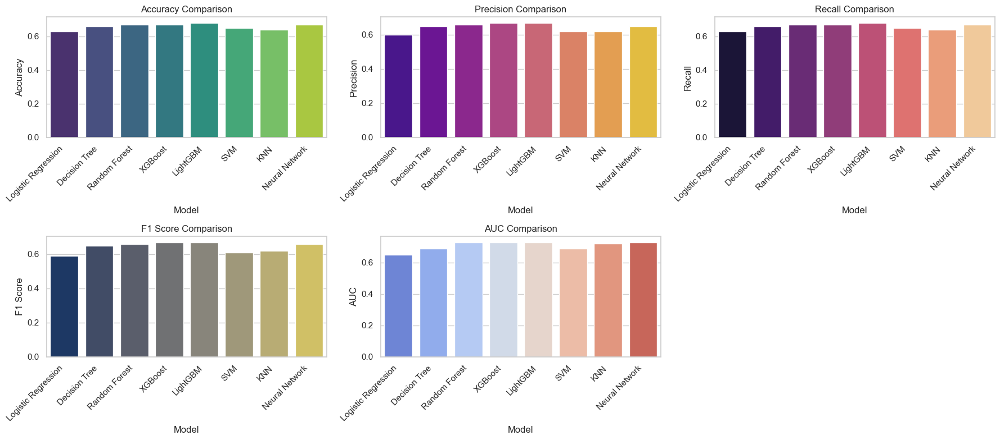

Classification performance comparison plot saved to 'classification_performance_comparison_engagement.png'.


Best Classification Model (Engagement): Random Forest
Best Engagement Model saved as 'best_engagement_model_Random Forest.joblib'



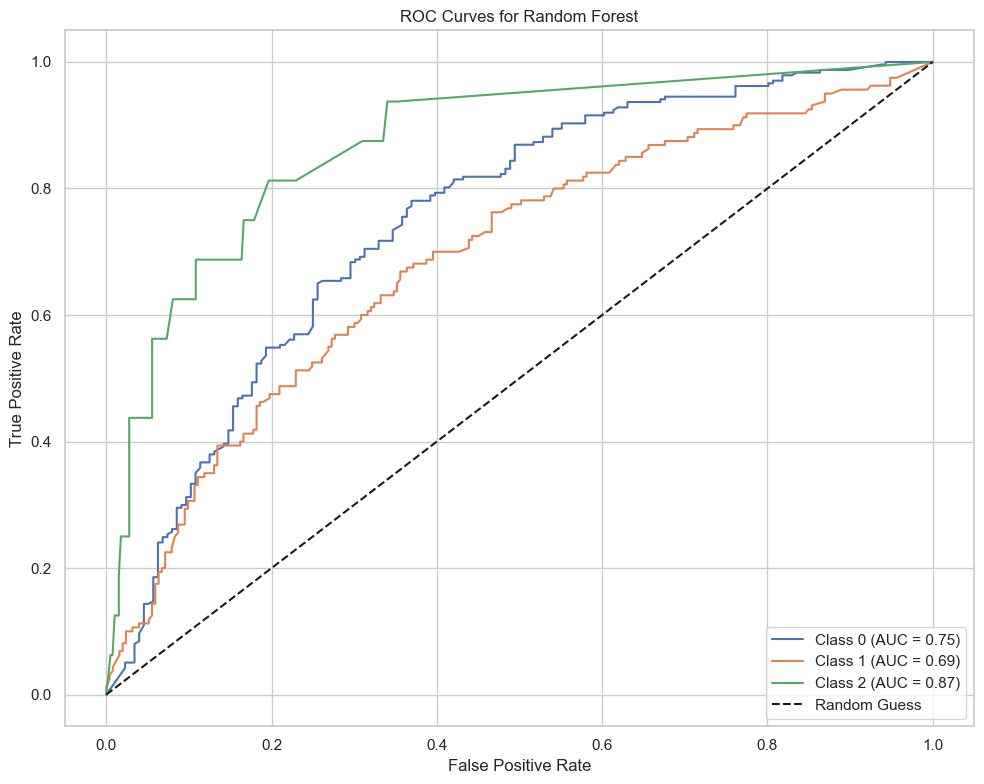

ROC curves plot saved to 'roc_curves_Random Forest.png'.



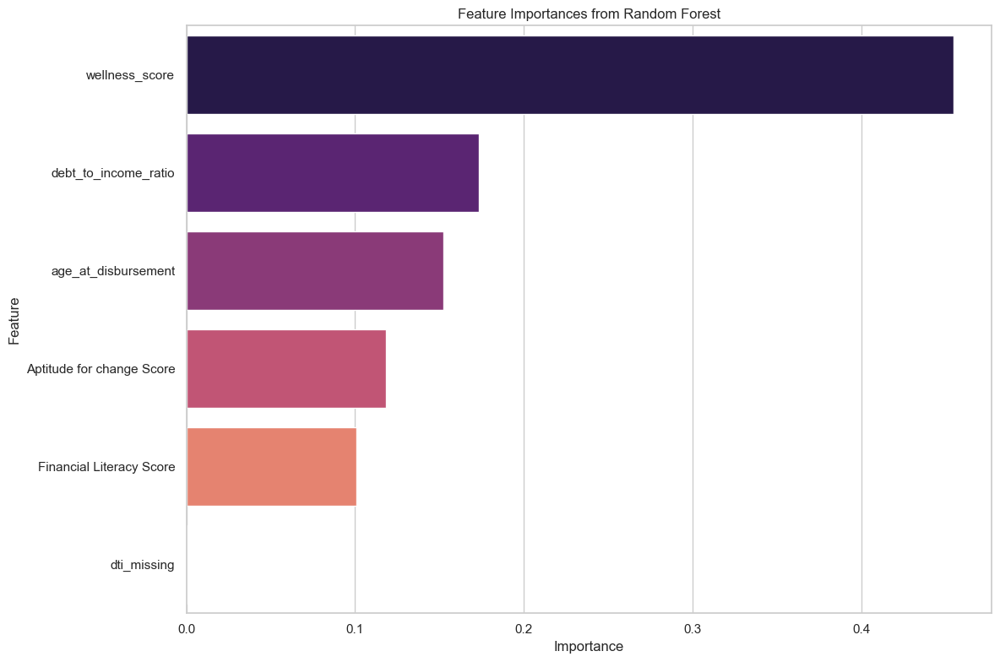

Feature importance plot saved to 'feature_importance_Random Forest.png'.


Performing SHAP analysis for Engagement Model...



 98%|===================| 1213/1239 [00:38<00:00]        

Number of classes in shap_values_eng: 3
Unique classes in y_engagement: [0, 1, 2]
Adjusted class_names_eng: ['Low Engagement', 'Medium Engagement', 'High Engagement']

SHAP Summary Plot for Low Engagement:


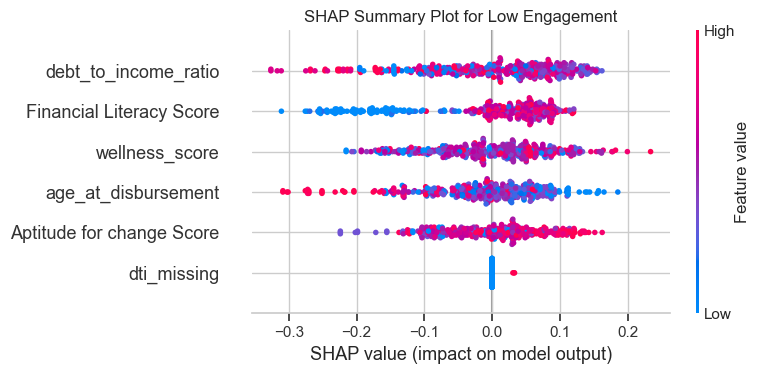

SHAP summary plot saved to 'shap_summary_Low_Engagement.png'.


SHAP Summary Plot for Medium Engagement:


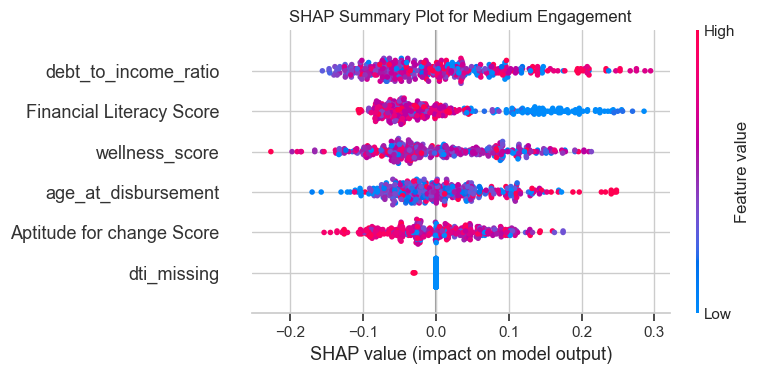

SHAP summary plot saved to 'shap_summary_Medium_Engagement.png'.


SHAP Summary Plot for High Engagement:


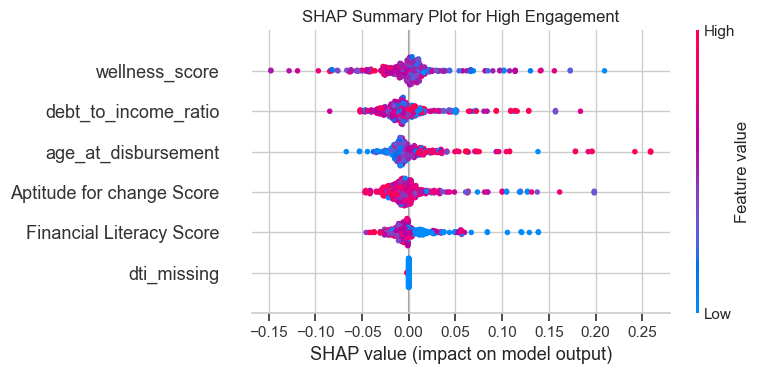

SHAP summary plot saved to 'shap_summary_High_Engagement.png'.

df_engagement DataFrame created and saved to 'df_engagement.csv'.

  customer_id True_Engagement_Level Predicted_Engagement_Level  \
0       13031        Low Engagement             Low Engagement   
1       15734        Low Engagement             Low Engagement   
2       16277        Low Engagement             Low Engagement   
3       13170        Low Engagement             Low Engagement   
4       11788     Medium Engagement          Medium Engagement   

   Predicted_Engagement_Probability  
0                          0.584212  
1                          0.631419  
2                          0.982375  
3                          0.897633  
4                          0.491369  
wellness_score               float64
Financial Literacy Score     float64
Aptitude for change Score    float64
age_at_disbursement          float64
debt_to_income_ratio         float64
dti_missing                    int64
dtype: object
KMeans S

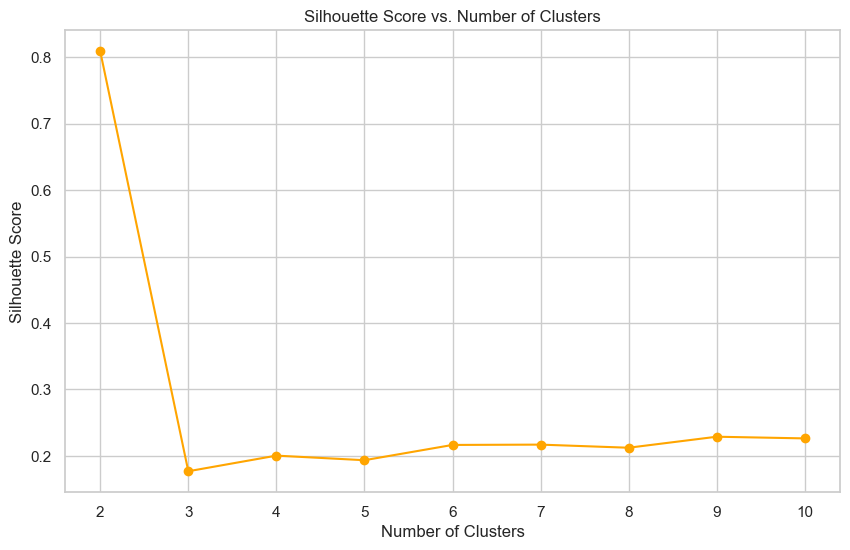

         wellness_score  Financial Literacy Score  Aptitude for change Score  \
Cluster                                                                        
0             56.523362                  3.695584                   3.931167   
1             44.039618                  3.664538                   2.752904   
2             57.527348                  2.596934                   3.554876   
3             40.895832                  1.466527                   3.788619   
4             54.615356                  0.408046                   3.926293   

         age_at_disbursement  debt_to_income_ratio  dti_missing  
Cluster                                                          
0                  37.933754              0.220716          0.0  
1                  43.910924              0.402450          0.0  
2                  41.165937              0.286002          1.0  
3                  32.569038              0.236213          0.0  
4                  54.169540              0

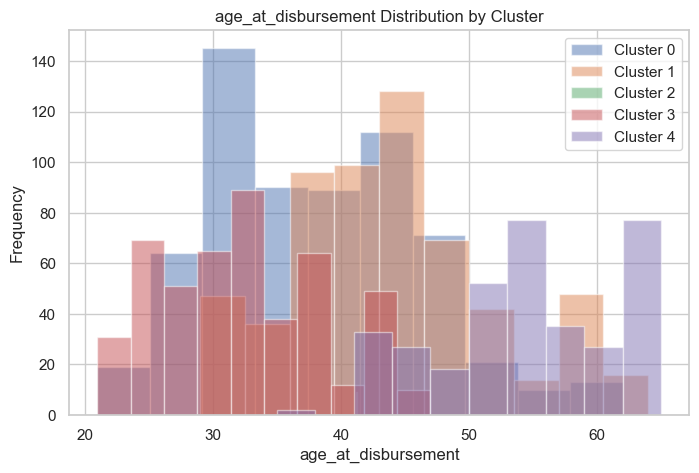

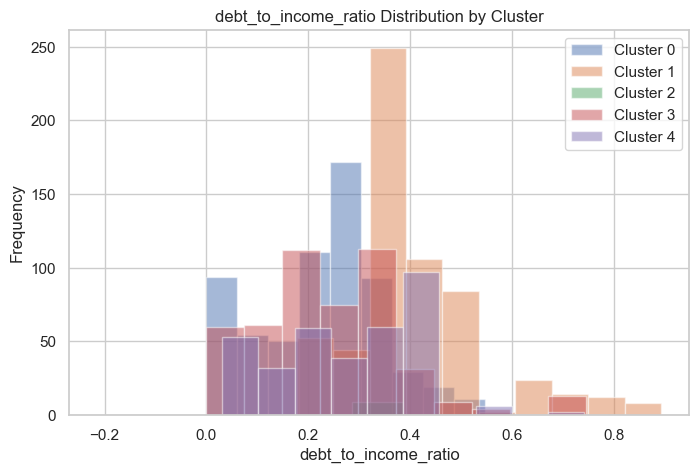

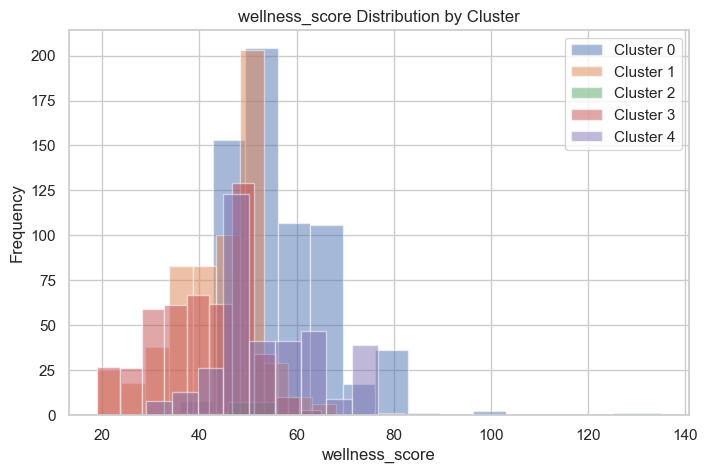

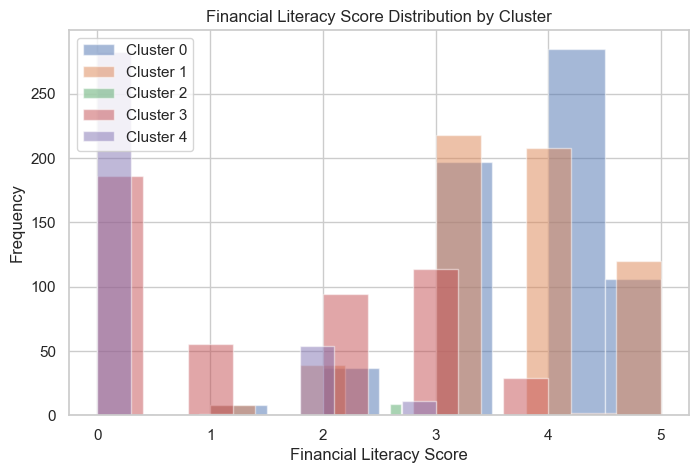

In [3]:
# ----------------------------
# 1. Customer Engagement Model (Classification)
# ----------------------------
print("Training Customer Engagement Model (Classification)...\n")

# Define Feature Columns for Engagement Model, including 'customer_id'
engagement_feature_columns = [
    'customer_id',  # Include customer_id for tracking
    'wellness_score',
    'Financial Literacy Score',
    'Aptitude for change Score',
    'age_at_disbursement',
    'debt_to_income_ratio',
    'dti_missing'  # Assuming you have created this indicator as previously discussed
] + [col for col in full_data_encoded.columns
     if 'Gender_' in col or 'Province_' in col or 'Residential Status_' in col]

# Ensure all engagement feature columns exist
missing_eng_features = [feat for feat in engagement_feature_columns if feat not in full_data_encoded.columns]
if missing_eng_features:
    print(f"\nWarning: The following engagement features are missing and will be skipped: {missing_eng_features}")
    engagement_feature_columns = [feat for feat in engagement_feature_columns if feat in full_data_encoded.columns]

# Define Engagement Levels
def categorize_engagement(count):
    if count >= 20:
        return 2  # High Engagement
    elif count >= 10:
        return 1  # Medium Engagement
    else:
        return 0  # Low Engagement

full_data_encoded['engagement_level'] = full_data_encoded['activities_count'].apply(categorize_engagement)

# Features and Target
X_engagement = full_data_encoded[engagement_feature_columns]
y_engagement = full_data_encoded['engagement_level']

# Extract customer_id before splitting
customer_ids = X_engagement['customer_id']
X_engagement = X_engagement.drop('customer_id', axis=1)  # Remove customer_id from features

# Train-Test Split, including customer_ids
X_train_eng, X_test_eng, y_train_eng, y_test_eng, train_ids, test_ids = train_test_split(
    X_engagement, y_engagement, customer_ids, test_size=0.2, random_state=42, stratify=y_engagement
)

# Feature Scaling
scaler_eng = StandardScaler()
X_train_eng_scaled = scaler_eng.fit_transform(X_train_eng)
X_test_eng_scaled = scaler_eng.transform(X_test_eng)

# **Save the fitted scaler**
joblib.dump(scaler_eng, os.path.join(OUTPUT_DIR, 'scaler_eng.joblib'))
print("Scaler for engagement model saved as 'scaler_eng.joblib'\n")

# Define Classification Models
classification_models_eng = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=200, random_state=42),
    'XGBoost': xgb.XGBClassifier(objective='multi:softprob', num_class=3, n_estimators=200, random_state=42),
    'LightGBM': lgb.LGBMClassifier(n_estimators=200, random_state=42),
    'SVM': SVC(kernel='rbf', probability=True, random_state=42),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'Neural Network': MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500, random_state=42)
}

# Dictionary to Store Performance Metrics
classification_performance_eng = {
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1 Score': [],
    'AUC': []
}

# Train and Evaluate Classification Models
for model_name, model in classification_models_eng.items():
    # Select appropriate data
    if model_name in ['Logistic Regression', 'SVM', 'KNN', 'Neural Network']:
        X_tr = X_train_eng_scaled
        X_te = X_test_eng_scaled
    else:
        X_tr = X_train_eng
        X_te = X_test_eng

    # Train the model
    model.fit(X_tr, y_train_eng)

    # Predict on test data
    y_pred = model.predict(X_te)
    y_pred_proba = model.predict_proba(X_te)

    # Calculate metrics
    accuracy = accuracy_score(y_test_eng, y_pred)
    precision = precision_score(y_test_eng, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test_eng, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test_eng, y_pred, average='weighted', zero_division=0)
    # Compute AUC for multi-class
    auc_score = roc_auc_score(y_test_eng, y_pred_proba, multi_class='ovr', average='weighted')

    # Store metrics
    classification_performance_eng['Model'].append(model_name)
    classification_performance_eng['Accuracy'].append(round(accuracy, 2))
    classification_performance_eng['Precision'].append(round(precision, 2))
    classification_performance_eng['Recall'].append(round(recall, 2))
    classification_performance_eng['F1 Score'].append(round(f1, 2))
    classification_performance_eng['AUC'].append(round(auc_score, 2))

    # Print metrics
    print(f"\n{model_name} Performance:")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision (Weighted): {precision:.2f}")
    print(f"Recall (Weighted): {recall:.2f}")
    print(f"F1 Score (Weighted): {f1:.2f}")
    print(f"AUC (Weighted OVR): {auc_score:.2f}")

# Compare Classification Models
classification_performance_eng_df = pd.DataFrame(classification_performance_eng)
print("\nClassification Model Performance Comparison (Engagement):")
print(classification_performance_eng_df.sort_values(by='AUC', ascending=False))

# Save Classification Performance
classification_performance_eng_df.to_csv(os.path.join(OUTPUT_DIR, 'classification_performance_engagement.csv'), index=False)
print("\nClassification performance metrics saved to 'classification_performance_engagement.csv'.\n")

# Visualize Classification Performance
plt.figure(figsize=(18, 8))

# Accuracy Comparison
plt.subplot(2, 3, 1)
sns.barplot(data=classification_performance_eng_df, x='Model', y='Accuracy', palette='viridis')
plt.xticks(rotation=45, ha='right')
plt.title('Accuracy Comparison')
plt.ylabel('Accuracy')
plt.xlabel('Model')

# Precision Comparison
plt.subplot(2, 3, 2)
sns.barplot(data=classification_performance_eng_df, x='Model', y='Precision', palette='plasma')
plt.xticks(rotation=45, ha='right')
plt.title('Precision Comparison')
plt.ylabel('Precision')
plt.xlabel('Model')

# Recall Comparison
plt.subplot(2, 3, 3)
sns.barplot(data=classification_performance_eng_df, x='Model', y='Recall', palette='magma')
plt.xticks(rotation=45, ha='right')
plt.title('Recall Comparison')
plt.ylabel('Recall')
plt.xlabel('Model')

# F1 Score Comparison
plt.subplot(2, 3, 4)
sns.barplot(data=classification_performance_eng_df, x='Model', y='F1 Score', palette='cividis')
plt.xticks(rotation=45, ha='right')
plt.title('F1 Score Comparison')
plt.ylabel('F1 Score')
plt.xlabel('Model')

# AUC Comparison
plt.subplot(2, 3, 5)
sns.barplot(data=classification_performance_eng_df, x='Model', y='AUC', palette='coolwarm')
plt.xticks(rotation=45, ha='right')
plt.title('AUC Comparison')
plt.ylabel('AUC')
plt.xlabel('Model')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'classification_performance_comparison_engagement.png'))
plt.show()
print("Classification performance comparison plot saved to 'classification_performance_comparison_engagement.png'.\n")

# Identify Best Classification Model
best_classification_model_name_eng = classification_performance_eng_df.sort_values(by='AUC', ascending=False).iloc[0]['Model']
best_classification_model_eng = classification_models_eng[best_classification_model_name_eng]
print(f"\nBest Classification Model (Engagement): {best_classification_model_name_eng}")

# **Save the Best Engagement Model**
joblib.dump(best_classification_model_eng, os.path.join(OUTPUT_DIR, f'best_engagement_model_{best_classification_model_name_eng}.joblib'))
print(f"Best Engagement Model saved as 'best_engagement_model_{best_classification_model_name_eng}.joblib'\n")

# Plot ROC Curves for Best Model
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

classes_eng = [0, 1, 2]
y_test_binarized_eng = label_binarize(y_test_eng, classes=classes_eng)
n_classes_eng = y_test_binarized_eng.shape[1]

# Use appropriate features
if best_classification_model_name_eng in ['Logistic Regression', 'SVM', 'KNN', 'Neural Network']:
    X_te_eng_final = X_test_eng_scaled
else:
    X_te_eng_final = X_test_eng

y_score_eng = best_classification_model_eng.predict_proba(X_te_eng_final)

# Compute ROC curve and ROC area for each class
fpr_eng = dict()
tpr_eng = dict()
roc_auc_eng = dict()

plt.figure(figsize=(10, 8))

for i in range(n_classes_eng):
    fpr_eng[i], tpr_eng[i], _ = roc_curve(y_test_binarized_eng[:, i], y_score_eng[:, i])
    roc_auc_eng[i] = auc(fpr_eng[i], tpr_eng[i])
    plt.plot(fpr_eng[i], tpr_eng[i],
             label=f'Class {classes_eng[i]} (AUC = {roc_auc_eng[i]:.2f})')

# Plotting
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curves for {best_classification_model_name_eng}')
plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f'roc_curves_{best_classification_model_name_eng}.png'))
plt.show()
print(f"ROC curves plot saved to 'roc_curves_{best_classification_model_name_eng}.png'.\n")

# Feature Importance for Best Classification Model
if best_classification_model_name_eng in ['Random Forest', 'XGBoost', 'LightGBM', 'Decision Tree']:
    importances_eng = best_classification_model_eng.feature_importances_
    # **Correcting feature_names_eng to exclude 'customer_id'**
    feature_names_eng = X_engagement.columns.tolist()  # Use the columns from X_engagement after dropping 'customer_id'
    feature_importance_df_eng = pd.DataFrame({
        'Feature': feature_names_eng,
        'Importance': importances_eng
    }).sort_values(by='Importance', ascending=False)

    # Plot Feature Importances
    plt.figure(figsize=(12, 8))
    sns.barplot(data=feature_importance_df_eng, x='Importance', y='Feature', palette='magma')
    plt.title(f'Feature Importances from {best_classification_model_name_eng}')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f'feature_importance_{best_classification_model_name_eng}.png'))
    plt.show()
    print(f"Feature importance plot saved to 'feature_importance_{best_classification_model_name_eng}.png'.\n")
elif best_classification_model_name_eng == 'Logistic Regression':
    coefficients_eng = best_classification_model_eng.coef_
    feature_names_eng = X_engagement.columns.tolist()  # Use the columns from X_engagement after dropping 'customer_id'
    coefficients_eng = coefficients_eng.T  # Transpose to (n_features, n_classes)
    coef_df_eng = pd.DataFrame(coefficients_eng, index=feature_names_eng, columns=[f'Class_{cls}' for cls in classes_eng])
    coef_df_eng['Importance'] = coef_df_eng.abs().max(axis=1)
    coef_df_eng = coef_df_eng.sort_values(by='Importance', ascending=False)

    # Plot Coefficients for each class
    coef_df_eng.drop('Importance', axis=1).plot(kind='bar', figsize=(12, 8))
    plt.title('Feature Coefficients from Logistic Regression')
    plt.xlabel('Feature')
    plt.ylabel('Coefficient Value')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f'coefficients_logistic_regression.png'))
    plt.show()
    print("Coefficient plot saved to 'coefficients_logistic_regression.png'.\n")
else:
    print(f"{best_classification_model_name_eng} does not provide straightforward feature importances.\n")

# ----------------------------
# SHAP Analysis for Engagement Model
# ----------------------------
print("\nPerforming SHAP analysis for Engagement Model...\n")

# Prepare data for SHAP
if best_classification_model_name_eng in ['Logistic Regression', 'SVM', 'KNN', 'Neural Network']:
    X_shap_eng = X_test_eng_scaled
else:
    X_shap_eng = X_test_eng

# Use the unified SHAP Explainer
explainer_eng = shap.Explainer(best_classification_model_eng, X_shap_eng)
shap_values_eng = explainer_eng(X_shap_eng)

# Number of classes according to SHAP values
if len(shap_values_eng.values.shape) == 2:
    # Binary classification
    n_classes_shap_eng = 1
else:
    # Multiclass classification
    n_classes_shap_eng = shap_values_eng.values.shape[2]
print(f"Number of classes in shap_values_eng: {n_classes_shap_eng}")

# Check unique classes in y_engagement
unique_classes_eng = sorted(y_engagement.unique())
print(f"Unique classes in y_engagement: {unique_classes_eng}")

# Create class names based on unique classes
class_mapping_eng = {0: 'Low Engagement', 1: 'Medium Engagement', 2: 'High Engagement'}
class_names_eng = [class_mapping_eng[cls] for cls in unique_classes_eng]
print(f"Adjusted class_names_eng: {class_names_eng}")

# Iterate over actual classes
for class_idx in range(n_classes_shap_eng):
    if n_classes_shap_eng == 1 and class_idx == 0:
        class_name = 'High Engagement'  # Assuming shap provides shap values for the positive class
    elif n_classes_shap_eng > 1:
        if class_idx >= len(class_names_eng):
            print(f"Class index {class_idx} exceeds class_names length; skipping.")
            continue
        class_name = class_names_eng[class_idx]
    else:
        print(f"Unexpected number of classes: {n_classes_shap_eng}")
        continue

    print(f"\nSHAP Summary Plot for {class_name}:")

    # Extract SHAP values for the class
    if n_classes_shap_eng == 1:
        shap_values_class_eng = shap_values_eng
    else:
        shap_values_class_eng = shap_values_eng[..., class_idx]

    # Generate the summary plot
    shap.summary_plot(shap_values_class_eng, show=False)
    plt.title(f'SHAP Summary Plot for {class_name}')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f'shap_summary_{class_name.replace(" ", "_")}.png'))
    plt.show()
    print(f"SHAP summary plot saved to 'shap_summary_{class_name.replace(' ', '_')}.png'.\n")

# ----------------------------
# Creating df_engagement DataFrame
# ----------------------------

# Get predicted labels and probabilities from the best model
if best_classification_model_name_eng in ['Logistic Regression', 'SVM', 'KNN', 'Neural Network']:
    X_te_eng_final = X_test_eng_scaled
else:
    X_te_eng_final = X_test_eng

y_pred_eng = best_classification_model_eng.predict(X_te_eng_final)
y_pred_proba_eng = best_classification_model_eng.predict_proba(X_te_eng_final)

# For multi-class, to get the probability of the predicted class
import numpy as np

predicted_class_indices = np.argmax(y_pred_proba_eng, axis=1)
predicted_probabilities = y_pred_proba_eng[np.arange(len(y_pred_eng)), predicted_class_indices]

# Create df_engagement DataFrame
df_engagement = pd.DataFrame({
    'customer_id': test_ids.values,
    'True_Engagement_Level': y_test_eng.values,
    'Predicted_Engagement_Level': y_pred_eng,
    'Predicted_Engagement_Probability': predicted_probabilities
})

# Optionally, map the numerical labels to categorical labels
engagement_level_mapping = {0: 'Low Engagement', 1: 'Medium Engagement', 2: 'High Engagement'}
df_engagement['True_Engagement_Level'] = df_engagement['True_Engagement_Level'].map(engagement_level_mapping)
df_engagement['Predicted_Engagement_Level'] = df_engagement['Predicted_Engagement_Level'].map(engagement_level_mapping)



# Save df_engagement to CSV
df_engagement.to_csv(os.path.join(OUTPUT_DIR, 'df_engagement.csv'), index=False)
print("df_engagement DataFrame created and saved to 'df_engagement.csv'.\n")

# Display the first few rows
print(df_engagement.head())

# KMeans
df1= full_data_encoded[[
    'customer_id',  # Include customer_id for tracking
    'wellness_score',
    'Financial Literacy Score',
    'Aptitude for change Score',
    'age_at_disbursement',
    'debt_to_income_ratio',
    # 'dti_missing'  # Assuming you have created this indicator as previously discussed
] ]

scaler = StandardScaler()
data_scaled = scaler.fit_transform(df1)

# ----------------------------
# KMeans Clustering without 'customer_id'
# ----------------------------

# Select only the numeric features for clustering
clustering_features = [
    'wellness_score',
    'Financial Literacy Score',
    'Aptitude for change Score',
    'age_at_disbursement',
    'debt_to_income_ratio',
    'dti_missing'
]

df1 = full_data_encoded[clustering_features].copy()

# Ensure all features are numeric
print(df1.dtypes)

# If any feature is not numeric, convert it
# Example:
# df1['some_feature'] = pd.to_numeric(df1['some_feature'], errors='coerce')

# Drop rows with NaN values resulting from conversion, if any
df1.dropna(inplace=True)

# Feature Scaling
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df1)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans_labels = kmeans.fit_predict(data_scaled)

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(data_scaled, kmeans_labels)
print('KMeans Silhouette Score:', silhouette_avg)

# Add the cluster labels to the dataframe
df1['Cluster'] = kmeans_labels

# Output the first few rows and silhouette score
print(df1.head(5))
print('KMeans Silhouette Score:', silhouette_avg)

# Determine the ideal number of clusters
inertia = []
silhouette_scores = []
cluster_range = range(2, 11)  # Test cluster sizes from 2 to 10

for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_scaled)
    inertia.append(kmeans.inertia_)
    silhouette_avg = silhouette_score(data_scaled, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette Scores
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, silhouette_scores, marker='o', color='orange')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

# Compute cluster summary
cluster_summary = df1.groupby('Cluster').mean()
print(cluster_summary)

# Plot feature distributions by cluster
features_to_plot = [
    'age_at_disbursement',
    'debt_to_income_ratio',
    'wellness_score',
    'Financial Literacy Score'
]

for feature in features_to_plot:
    plt.figure(figsize=(8, 5))
    for cluster in sorted(df1['Cluster'].unique()):
        subset = df1[df1['Cluster'] == cluster]
        plt.hist(subset[feature], alpha=0.5, label=f'Cluster {cluster}')
    plt.title(f'{feature} Distribution by Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()


Training Loan Repayment Risk Model (Classification)...


Repayment_Risk column created in full_data:
   customer_id  Loan Status  Repayment_Risk
0        11011       Active               0
19       11036       Active               0
39       11154  Written off               1
42       11169     Past due               1
43       11182       Repaid               0
Number of high-risk loans: 37

After merging, columns in df_encoded:
['customer_id', 'quiz_answer_count', 'mood_answer_count', 'inspiration_answer_count', 'self_assessment_count', 'activities_count', 'wellness_score', 'Disbursement Date', 'Loan Status', 'Loan Amount', 'Outstanding Balance', 'Outstanding Principal', 'Interest Rate', 'Loan Term (Months)', 'Date of Birth', 'Gender', 'Province', 'Residential Status', 'Stated Income on application', 'Qualified / Verified\nIncome', 'Aptitude for change Score', 'Financial Literacy Score', 'Self Assessments', 'Quiz Count', 'Mood Count', 'Inspiration Count', 'Total Activities ', 'Avera

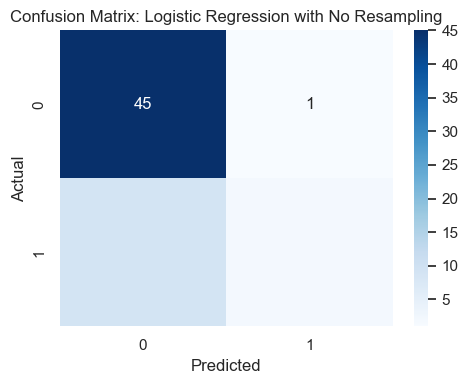

Confusion matrix saved to 'confusion_matrix_Logistic Regression_No Resampling.png'.



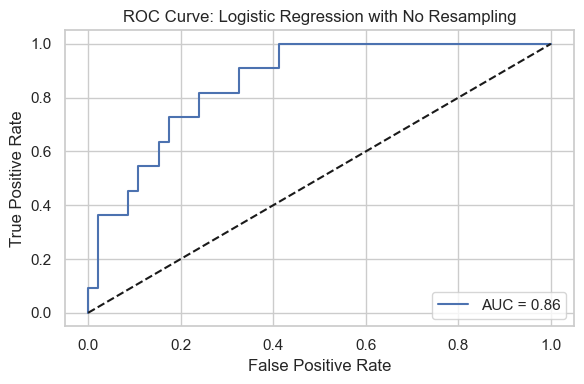

ROC curve saved to 'roc_curve_Logistic Regression_No Resampling.png'.


Training and tuning Decision Tree with No Resampling...

Decision Tree Performance with No Resampling:
Accuracy: 0.74
Precision: 0.25
Recall: 0.18
F1-Score: 0.21
AUC: 0.57


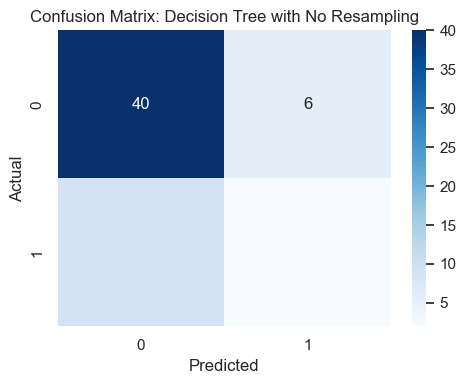

Confusion matrix saved to 'confusion_matrix_Decision Tree_No Resampling.png'.



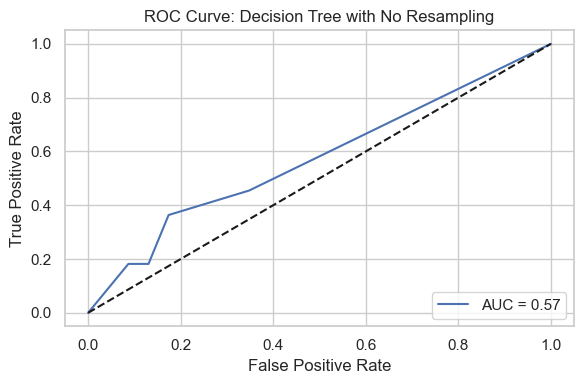

ROC curve saved to 'roc_curve_Decision Tree_No Resampling.png'.


Training and tuning Random Forest with No Resampling...

Random Forest Performance with No Resampling:
Accuracy: 0.86
Precision: 1.00
Recall: 0.27
F1-Score: 0.43
AUC: 0.77


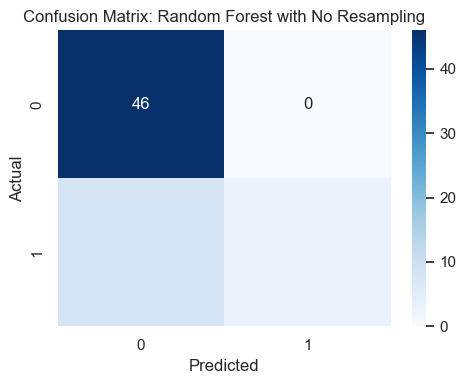

Confusion matrix saved to 'confusion_matrix_Random Forest_No Resampling.png'.



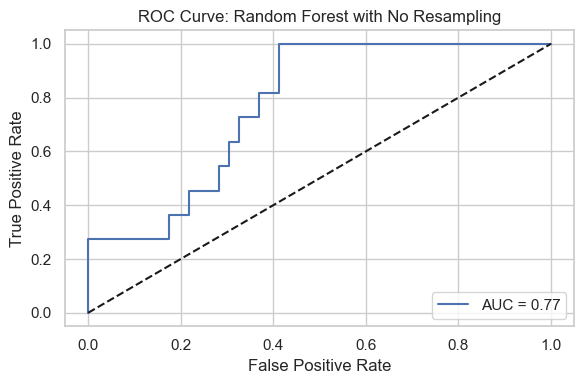

ROC curve saved to 'roc_curve_Random Forest_No Resampling.png'.


Training and tuning XGBoost with No Resampling...


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packa


XGBoost Performance with No Resampling:
Accuracy: 0.82
Precision: 1.00
Recall: 0.09
F1-Score: 0.17
AUC: 0.70


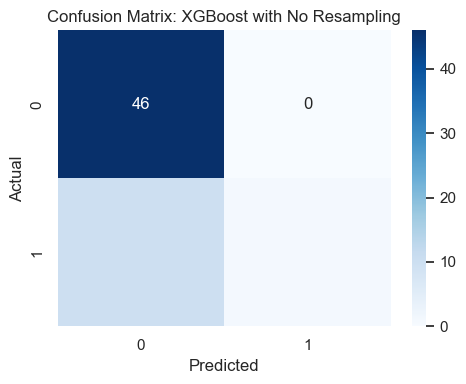

Confusion matrix saved to 'confusion_matrix_XGBoost_No Resampling.png'.



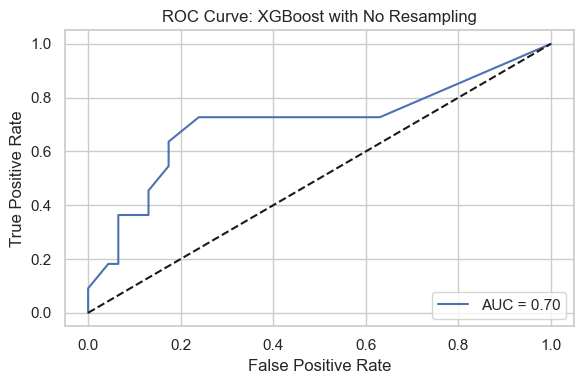

ROC curve saved to 'roc_curve_XGBoost_No Resampling.png'.


Training and tuning LightGBM with No Resampling...
[LightGBM] [Info] Number of positive: 21, number of negative: 84
[LightGBM] [Info] Number of positive: 21, number of negative: 84
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of positive: 20, number of negative: 84
[LightGBM] [Info] Number of data points in the train set: 105, number of used features: 3
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 105, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.200000 -> initscore=-1.386294
[LightGBM] [Info] Start training from score 

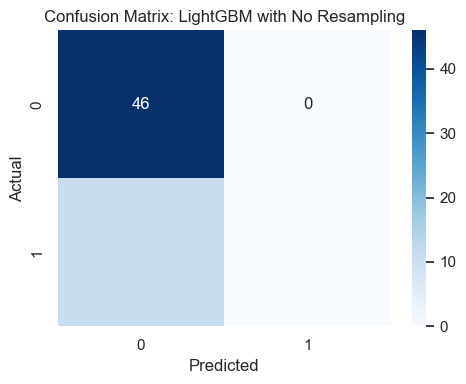

Confusion matrix saved to 'confusion_matrix_LightGBM_No Resampling.png'.



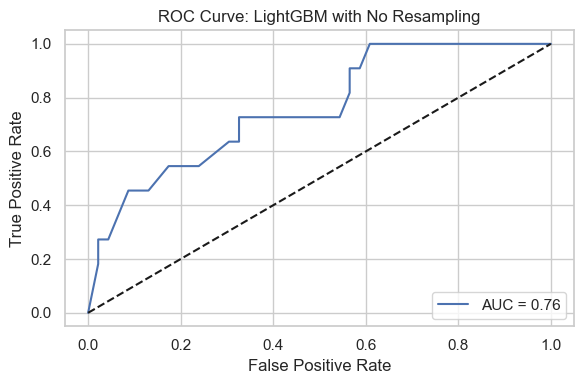

ROC curve saved to 'roc_curve_LightGBM_No Resampling.png'.


Training and tuning KNN with No Resampling...

KNN Performance with No Resampling:
Accuracy: 0.82
Precision: 1.00
Recall: 0.09
F1-Score: 0.17
AUC: 0.73


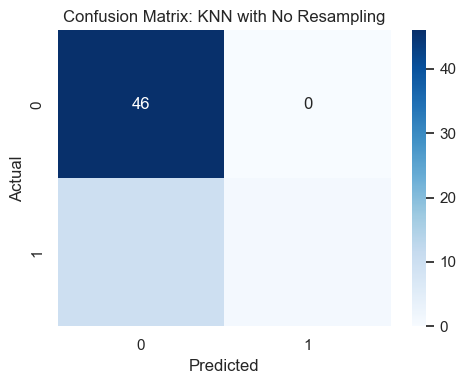

Confusion matrix saved to 'confusion_matrix_KNN_No Resampling.png'.



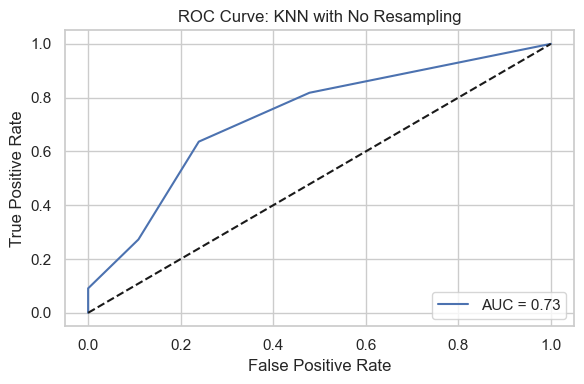

ROC curve saved to 'roc_curve_KNN_No Resampling.png'.


--- Resampling Method: Random Under-Sampling ---

Applied Random Under-Sampling. Resampled training set size: 52

Training and tuning Logistic Regression with Random Under-Sampling...

Logistic Regression Performance with Random Under-Sampling:
Accuracy: 0.75
Precision: 0.42
Recall: 0.73
F1-Score: 0.53
AUC: 0.84


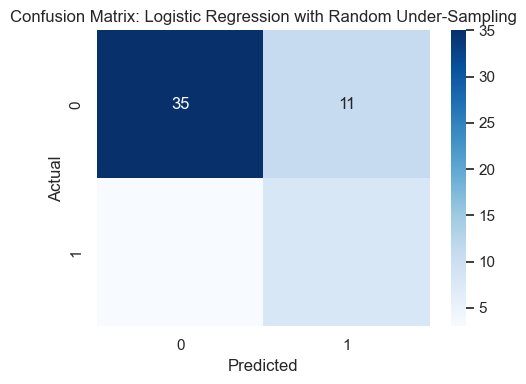

Confusion matrix saved to 'confusion_matrix_Logistic Regression_Random Under-Sampling.png'.



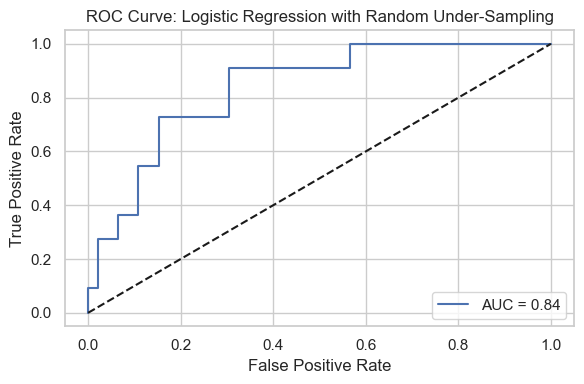

ROC curve saved to 'roc_curve_Logistic Regression_Random Under-Sampling.png'.


Training and tuning Decision Tree with Random Under-Sampling...

Decision Tree Performance with Random Under-Sampling:
Accuracy: 0.72
Precision: 0.37
Recall: 0.64
F1-Score: 0.47
AUC: 0.70


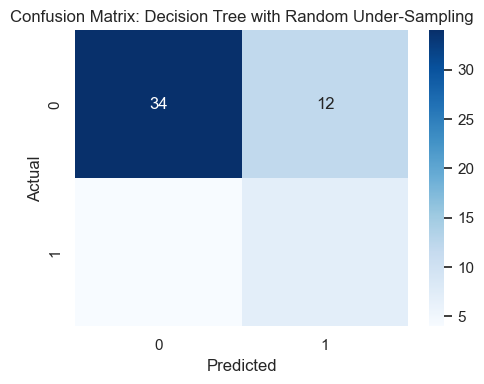

Confusion matrix saved to 'confusion_matrix_Decision Tree_Random Under-Sampling.png'.



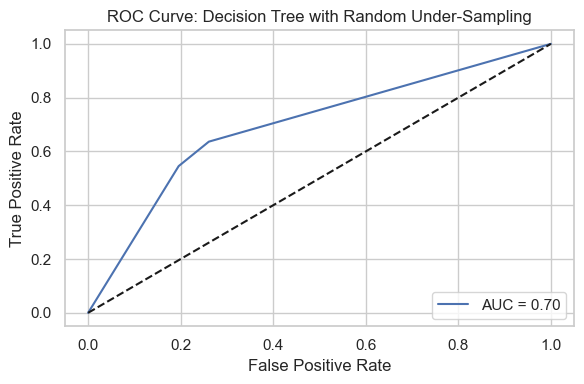

ROC curve saved to 'roc_curve_Decision Tree_Random Under-Sampling.png'.


Training and tuning Random Forest with Random Under-Sampling...

Random Forest Performance with Random Under-Sampling:
Accuracy: 0.67
Precision: 0.33
Recall: 0.73
F1-Score: 0.46
AUC: 0.76


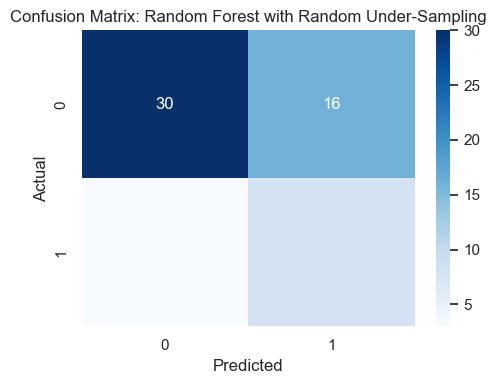

Confusion matrix saved to 'confusion_matrix_Random Forest_Random Under-Sampling.png'.



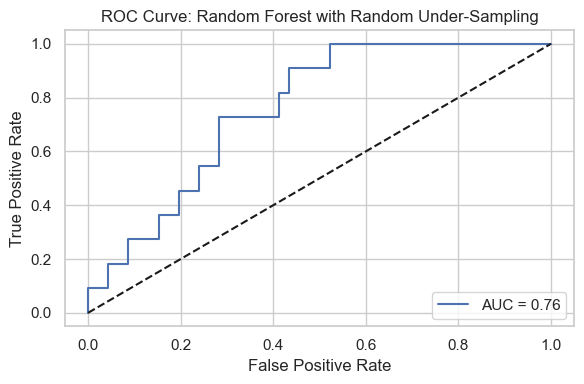

ROC curve saved to 'roc_curve_Random Forest_Random Under-Sampling.png'.


Training and tuning XGBoost with Random Under-Sampling...


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packa


XGBoost Performance with Random Under-Sampling:
Accuracy: 0.61
Precision: 0.28
Recall: 0.64
F1-Score: 0.39
AUC: 0.68


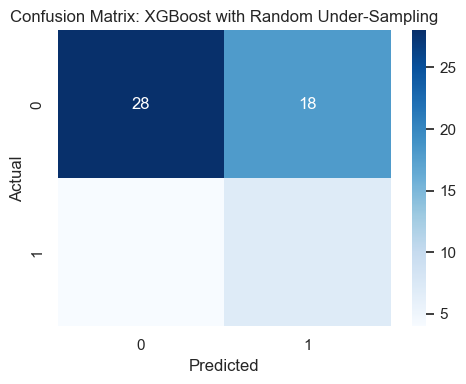

Confusion matrix saved to 'confusion_matrix_XGBoost_Random Under-Sampling.png'.



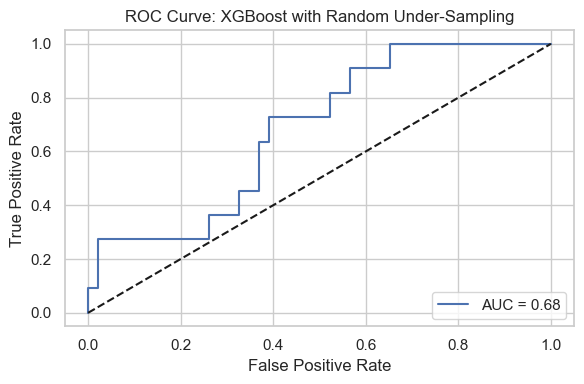

ROC curve saved to 'roc_curve_XGBoost_Random Under-Sampling.png'.


Training and tuning LightGBM with Random Under-Sampling...
[LightGBM] [Info] Number of positive: 20, number of negative: 21
[LightGBM] [Info] Number of positive: 21, number of negative: 20
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 45
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 30
[LightGBM] [Info] Number of data points in the train set: 41, number of used features: 3
[LightGBM] [Info] Number of data points in the train set: 41, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.487805 -> initscore=-0.048790
[LightGBM] [Info] Start training from score -0.048790
[LightGBM] [Info] [binary:BoostFromScore]: 

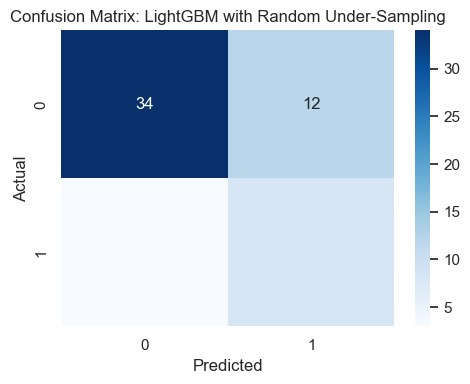

Confusion matrix saved to 'confusion_matrix_LightGBM_Random Under-Sampling.png'.



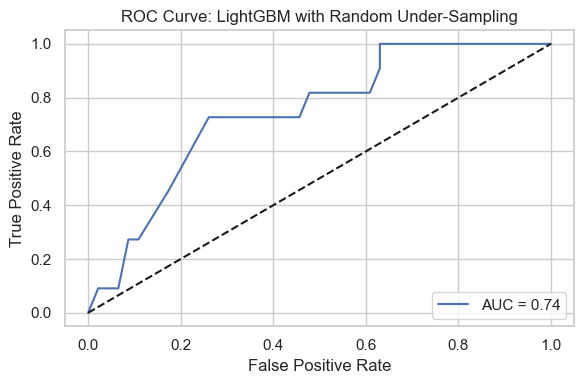

ROC curve saved to 'roc_curve_LightGBM_Random Under-Sampling.png'.


Training and tuning KNN with Random Under-Sampling...

KNN Performance with Random Under-Sampling:
Accuracy: 0.72
Precision: 0.38
Recall: 0.73
F1-Score: 0.50
AUC: 0.79


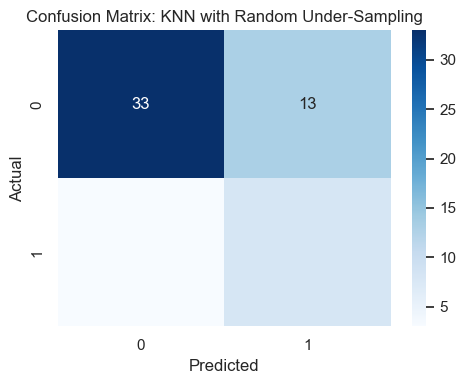

Confusion matrix saved to 'confusion_matrix_KNN_Random Under-Sampling.png'.



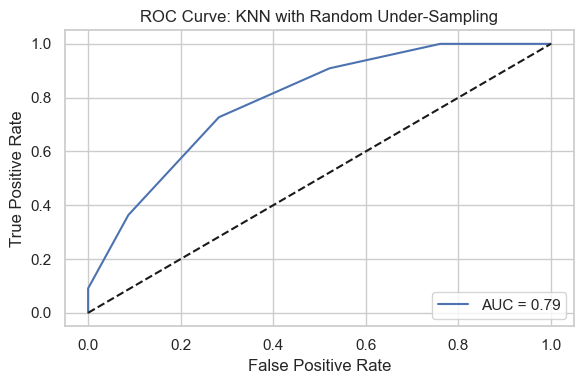

ROC curve saved to 'roc_curve_KNN_Random Under-Sampling.png'.


--- Resampling Method: Random Over-Sampling ---

Applied Random Over-Sampling. Resampled training set size: 210

Training and tuning Logistic Regression with Random Over-Sampling...

Logistic Regression Performance with Random Over-Sampling:
Accuracy: 0.72
Precision: 0.38
Recall: 0.73
F1-Score: 0.50
AUC: 0.85


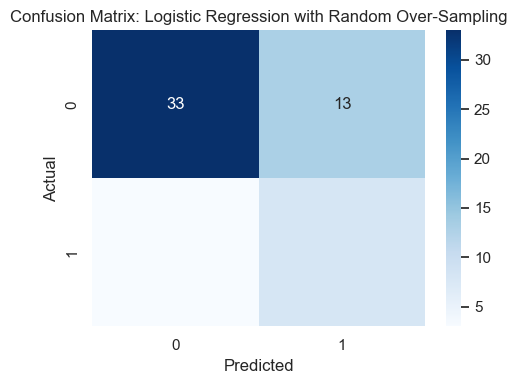

Confusion matrix saved to 'confusion_matrix_Logistic Regression_Random Over-Sampling.png'.



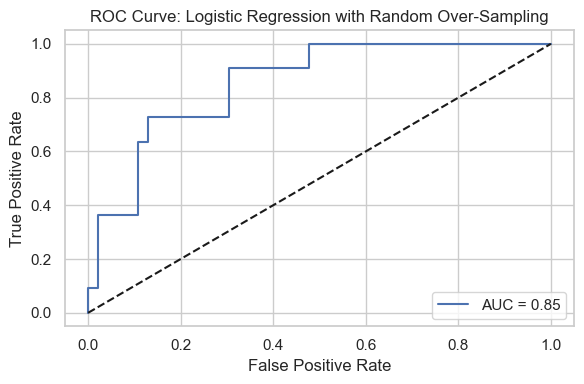

ROC curve saved to 'roc_curve_Logistic Regression_Random Over-Sampling.png'.


Training and tuning Decision Tree with Random Over-Sampling...

Decision Tree Performance with Random Over-Sampling:
Accuracy: 0.74
Precision: 0.36
Recall: 0.45
F1-Score: 0.40
AUC: 0.63


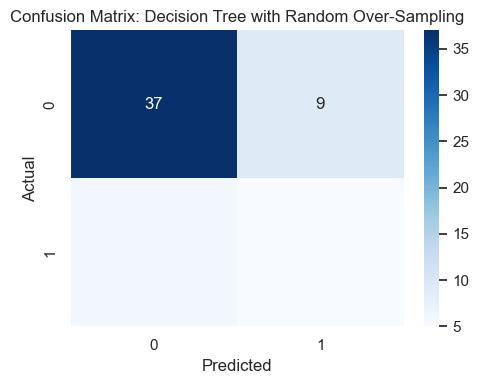

Confusion matrix saved to 'confusion_matrix_Decision Tree_Random Over-Sampling.png'.



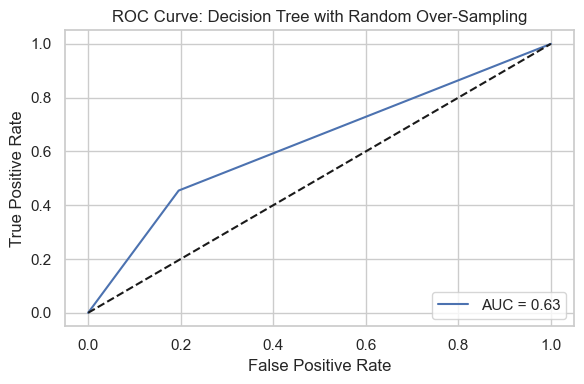

ROC curve saved to 'roc_curve_Decision Tree_Random Over-Sampling.png'.


Training and tuning Random Forest with Random Over-Sampling...

Random Forest Performance with Random Over-Sampling:
Accuracy: 0.77
Precision: 0.38
Recall: 0.27
F1-Score: 0.32
AUC: 0.77


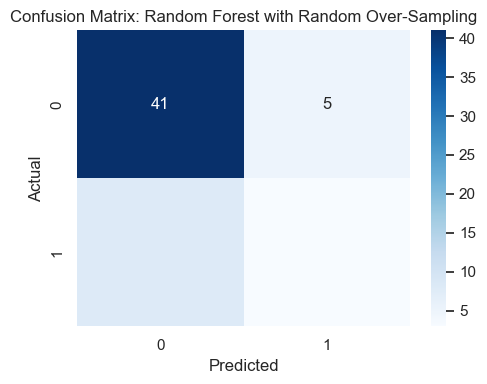

Confusion matrix saved to 'confusion_matrix_Random Forest_Random Over-Sampling.png'.



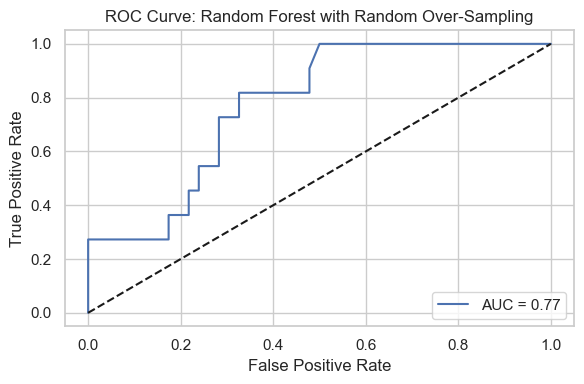

ROC curve saved to 'roc_curve_Random Forest_Random Over-Sampling.png'.


Training and tuning XGBoost with Random Over-Sampling...


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:43] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:43] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:43] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:05:43] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packa


XGBoost Performance with Random Over-Sampling:
Accuracy: 0.70
Precision: 0.25
Recall: 0.27
F1-Score: 0.26
AUC: 0.77


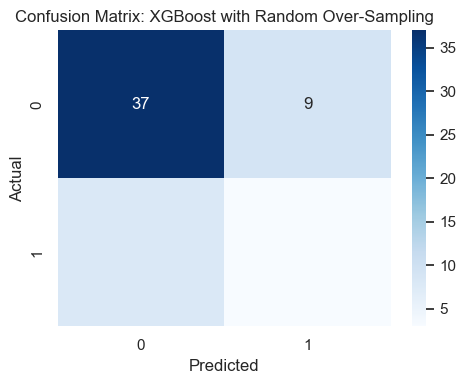

Confusion matrix saved to 'confusion_matrix_XGBoost_Random Over-Sampling.png'.



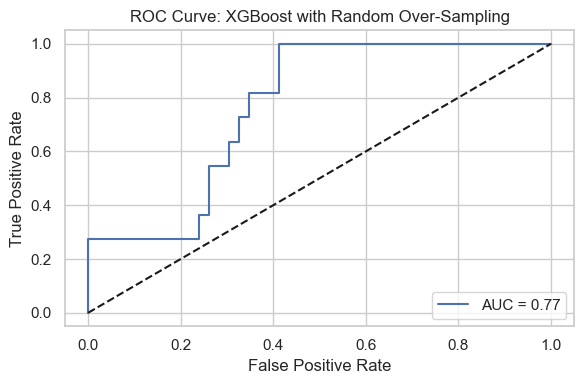

ROC curve saved to 'roc_curve_XGBoost_Random Over-Sampling.png'.


Training and tuning LightGBM with Random Over-Sampling...
[LightGBM] [Info] Number of positive: 84, number of negative: 84
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 132
[LightGBM] [Info] Number of data points in the train set: 168, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 84, number of negative: 84
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 138
[LightGBM] [Info] Number of data points in the train set: 168, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warni

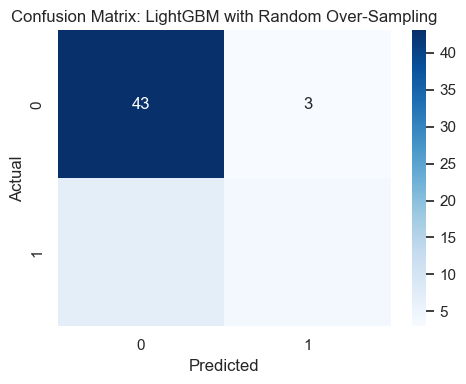

Confusion matrix saved to 'confusion_matrix_LightGBM_Random Over-Sampling.png'.



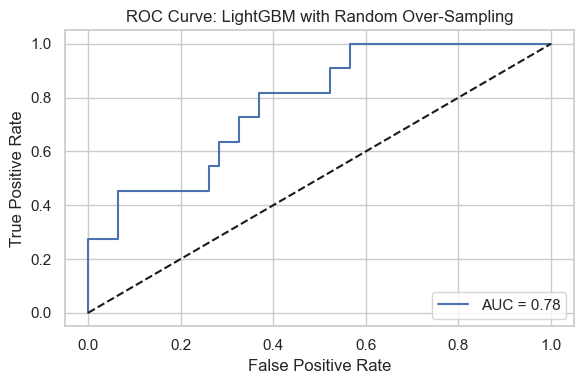

ROC curve saved to 'roc_curve_LightGBM_Random Over-Sampling.png'.


Training and tuning KNN with Random Over-Sampling...

KNN Performance with Random Over-Sampling:
Accuracy: 0.70
Precision: 0.36
Recall: 0.73
F1-Score: 0.48
AUC: 0.75


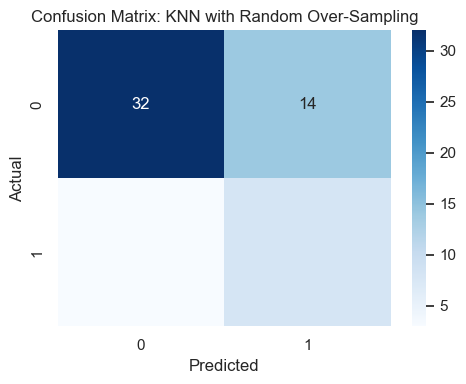

Confusion matrix saved to 'confusion_matrix_KNN_Random Over-Sampling.png'.



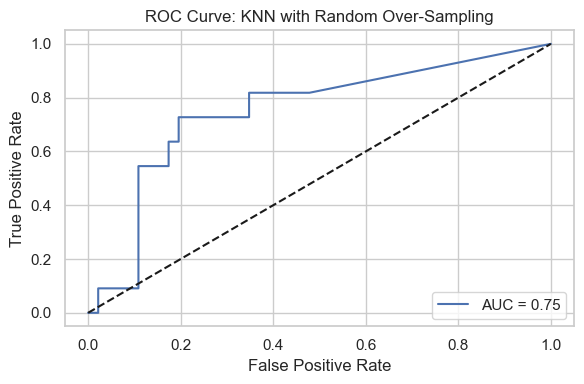

ROC curve saved to 'roc_curve_KNN_Random Over-Sampling.png'.


--- Resampling Method: SMOTE ---

Applied SMOTE. Resampled training set size: 210

Training and tuning Logistic Regression with SMOTE...

Logistic Regression Performance with SMOTE:
Accuracy: 0.74
Precision: 0.40
Recall: 0.73
F1-Score: 0.52
AUC: 0.85


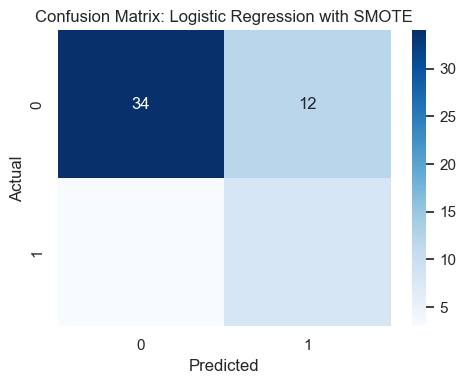

Confusion matrix saved to 'confusion_matrix_Logistic Regression_SMOTE.png'.



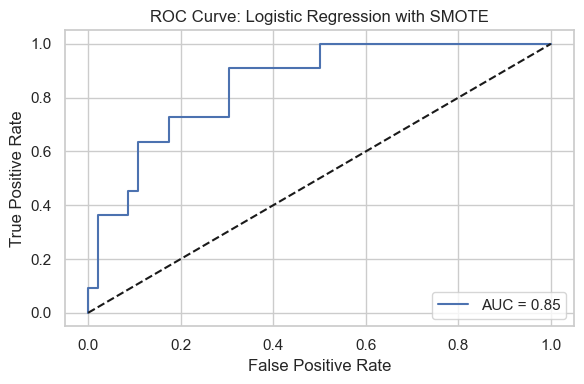

ROC curve saved to 'roc_curve_Logistic Regression_SMOTE.png'.


Training and tuning Decision Tree with SMOTE...

Decision Tree Performance with SMOTE:
Accuracy: 0.74
Precision: 0.33
Recall: 0.36
F1-Score: 0.35
AUC: 0.58


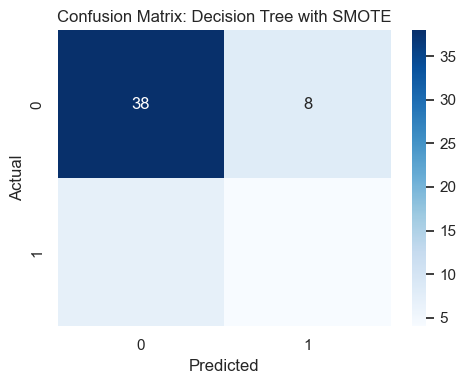

Confusion matrix saved to 'confusion_matrix_Decision Tree_SMOTE.png'.



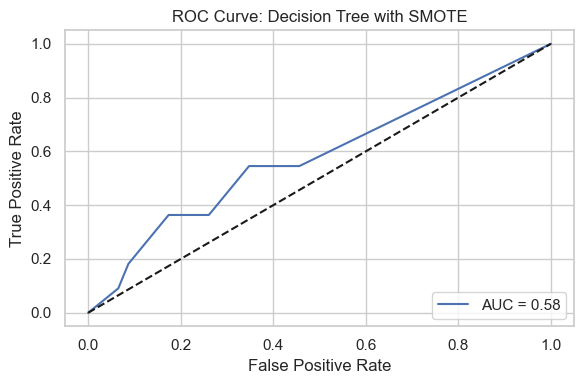

ROC curve saved to 'roc_curve_Decision Tree_SMOTE.png'.


Training and tuning Random Forest with SMOTE...

Random Forest Performance with SMOTE:
Accuracy: 0.70
Precision: 0.31
Recall: 0.45
F1-Score: 0.37
AUC: 0.75


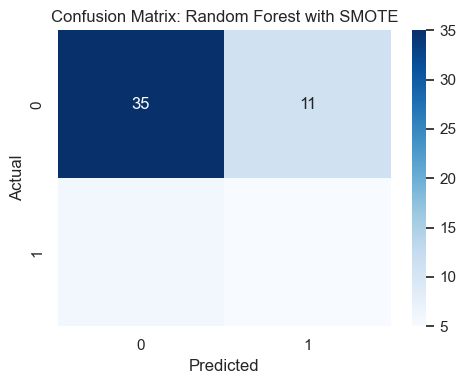

Confusion matrix saved to 'confusion_matrix_Random Forest_SMOTE.png'.



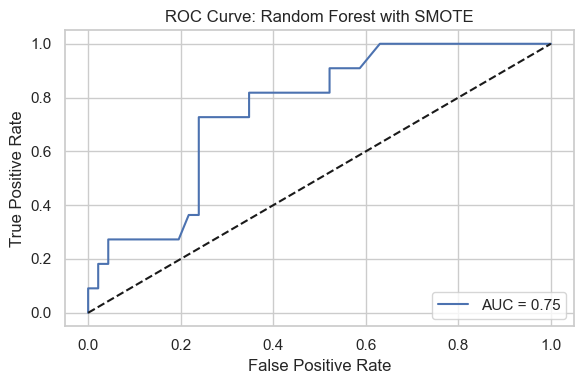

ROC curve saved to 'roc_curve_Random Forest_SMOTE.png'.


Training and tuning XGBoost with SMOTE...


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:06:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:06:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:06:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:06:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packa


XGBoost Performance with SMOTE:
Accuracy: 0.74
Precision: 0.33
Recall: 0.36
F1-Score: 0.35
AUC: 0.78


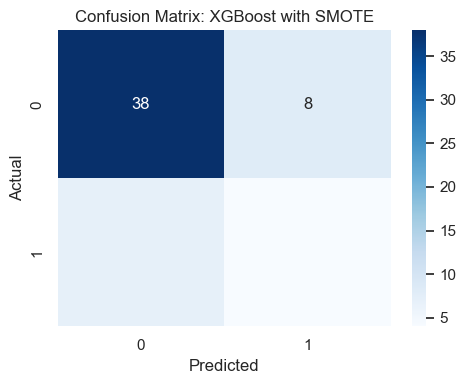

Confusion matrix saved to 'confusion_matrix_XGBoost_SMOTE.png'.



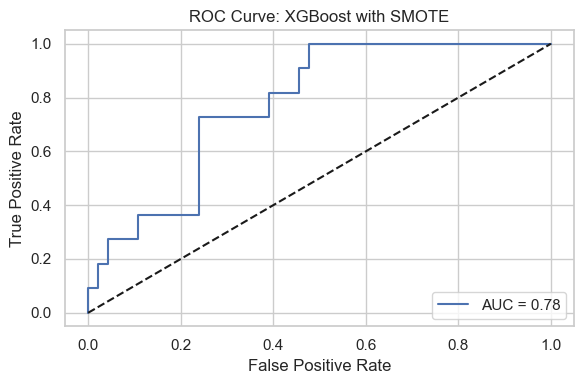

ROC curve saved to 'roc_curve_XGBoost_SMOTE.png'.


Training and tuning LightGBM with SMOTE...
[LightGBM] [Info] Number of positive: 84, number of negative: 84
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Number of data points in the train set: 168, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 84, number of negative: 84
[LightGBM] [Info] Number of positive: 84, number of negative: 84
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the

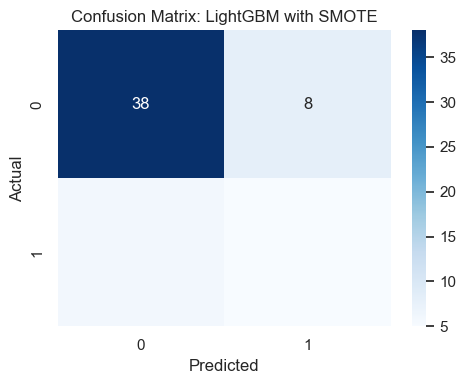

Confusion matrix saved to 'confusion_matrix_LightGBM_SMOTE.png'.



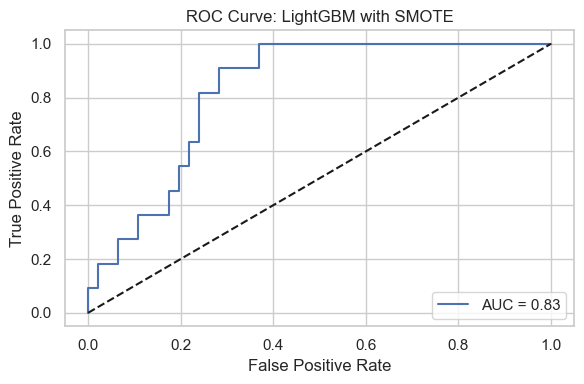

ROC curve saved to 'roc_curve_LightGBM_SMOTE.png'.


Training and tuning KNN with SMOTE...

KNN Performance with SMOTE:
Accuracy: 0.72
Precision: 0.38
Recall: 0.73
F1-Score: 0.50
AUC: 0.77


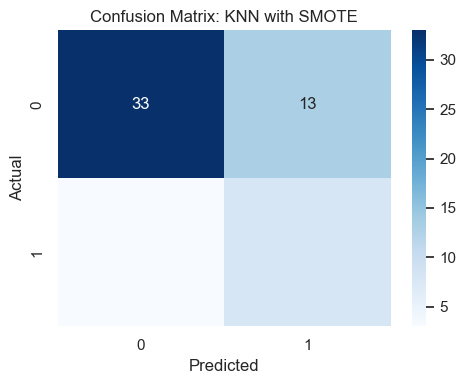

Confusion matrix saved to 'confusion_matrix_KNN_SMOTE.png'.



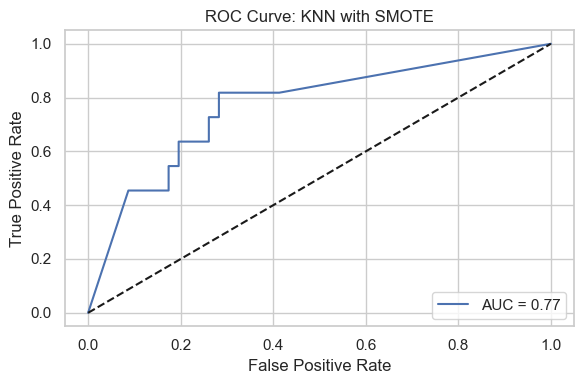

ROC curve saved to 'roc_curve_KNN_SMOTE.png'.


--- Resampling Method: ADASYN ---

Applied ADASYN. Resampled training set size: 207

Training and tuning Logistic Regression with ADASYN...

Logistic Regression Performance with ADASYN:
Accuracy: 0.74
Precision: 0.40
Recall: 0.73
F1-Score: 0.52
AUC: 0.85


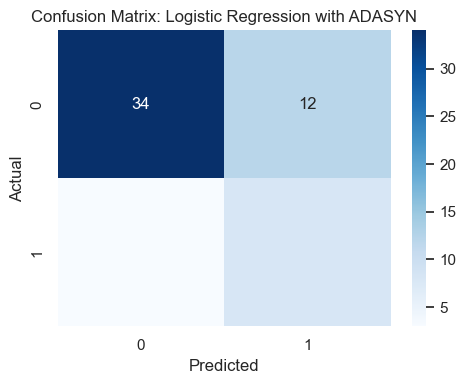

Confusion matrix saved to 'confusion_matrix_Logistic Regression_ADASYN.png'.



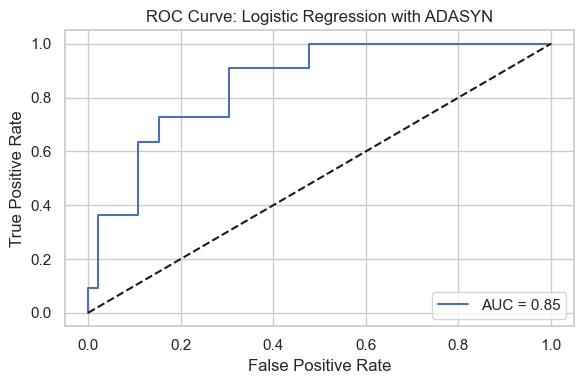

ROC curve saved to 'roc_curve_Logistic Regression_ADASYN.png'.


Training and tuning Decision Tree with ADASYN...

Decision Tree Performance with ADASYN:
Accuracy: 0.68
Precision: 0.29
Recall: 0.45
F1-Score: 0.36
AUC: 0.61


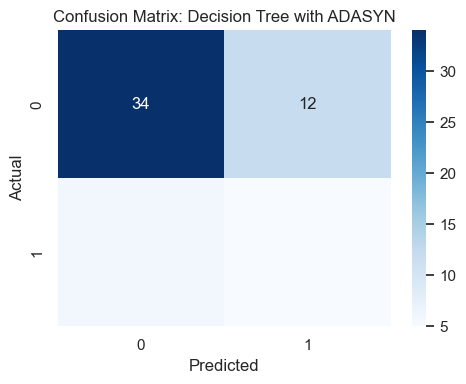

Confusion matrix saved to 'confusion_matrix_Decision Tree_ADASYN.png'.



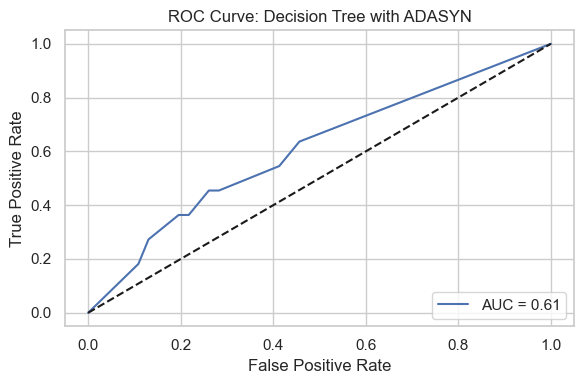

ROC curve saved to 'roc_curve_Decision Tree_ADASYN.png'.


Training and tuning Random Forest with ADASYN...

Random Forest Performance with ADASYN:
Accuracy: 0.74
Precision: 0.36
Recall: 0.45
F1-Score: 0.40
AUC: 0.78


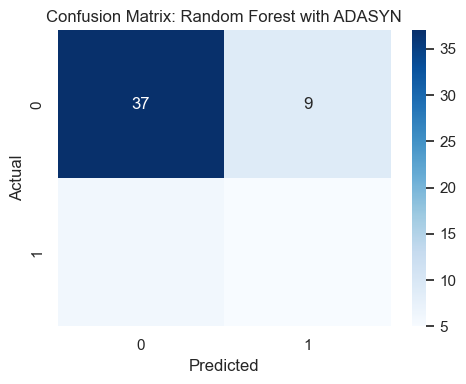

Confusion matrix saved to 'confusion_matrix_Random Forest_ADASYN.png'.



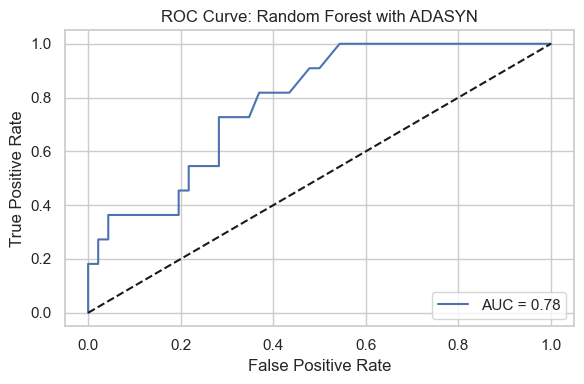

ROC curve saved to 'roc_curve_Random Forest_ADASYN.png'.


Training and tuning XGBoost with ADASYN...


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:06:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:06:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:06:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:06:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packa


XGBoost Performance with ADASYN:
Accuracy: 0.72
Precision: 0.33
Recall: 0.45
F1-Score: 0.38
AUC: 0.77


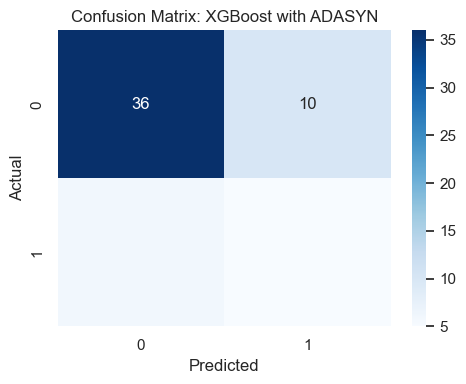

Confusion matrix saved to 'confusion_matrix_XGBoost_ADASYN.png'.



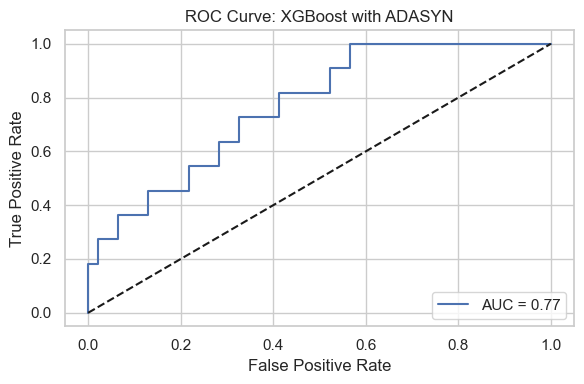

ROC curve saved to 'roc_curve_XGBoost_ADASYN.png'.


Training and tuning LightGBM with ADASYN...
[LightGBM] [Info] Number of positive: 81, number of negative: 84
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 167
[LightGBM] [Info] Number of data points in the train set: 165, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.490909 -> initscore=-0.036368
[LightGBM] [Info] Start training from score -0.036368
[LightGBM] [Info] Number of positive: 81, number of negative: 84
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 165, number of used featur

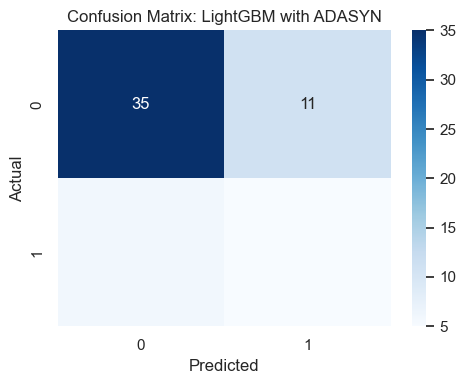

Confusion matrix saved to 'confusion_matrix_LightGBM_ADASYN.png'.



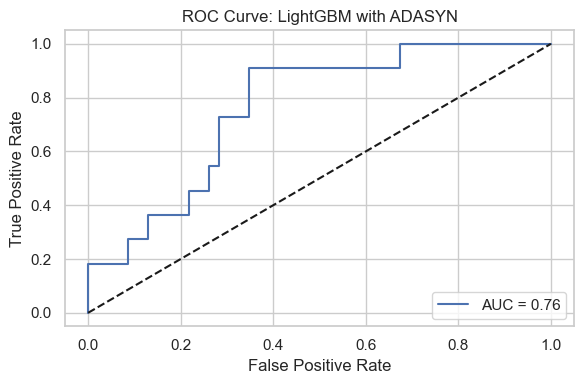

ROC curve saved to 'roc_curve_LightGBM_ADASYN.png'.


Training and tuning KNN with ADASYN...

KNN Performance with ADASYN:
Accuracy: 0.79
Precision: 0.47
Recall: 0.73
F1-Score: 0.57
AUC: 0.72


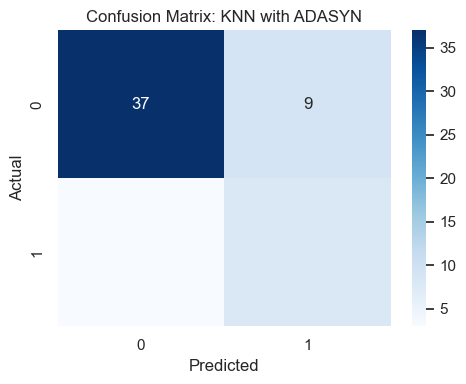

Confusion matrix saved to 'confusion_matrix_KNN_ADASYN.png'.



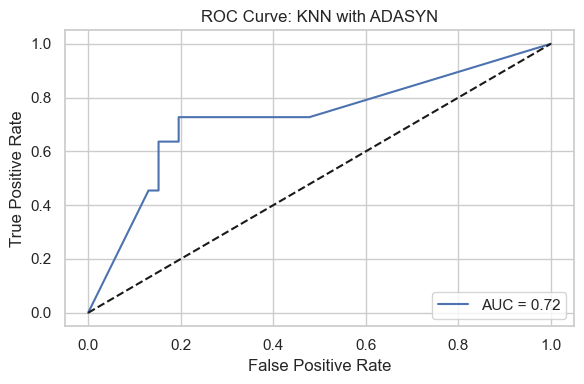

ROC curve saved to 'roc_curve_KNN_ADASYN.png'.


--- Resampling Method: SMOTEENN ---

Applied SMOTEENN. Resampled training set size: 122

Training and tuning Logistic Regression with SMOTEENN...

Logistic Regression Performance with SMOTEENN:
Accuracy: 0.67
Precision: 0.36
Recall: 0.91
F1-Score: 0.51
AUC: 0.84


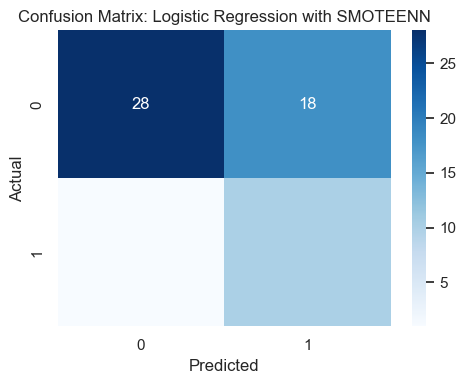

Confusion matrix saved to 'confusion_matrix_Logistic Regression_SMOTEENN.png'.



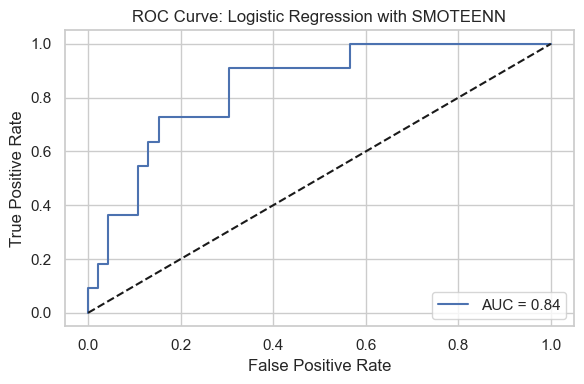

ROC curve saved to 'roc_curve_Logistic Regression_SMOTEENN.png'.


Training and tuning Decision Tree with SMOTEENN...

Decision Tree Performance with SMOTEENN:
Accuracy: 0.68
Precision: 0.33
Recall: 0.64
F1-Score: 0.44
AUC: 0.67


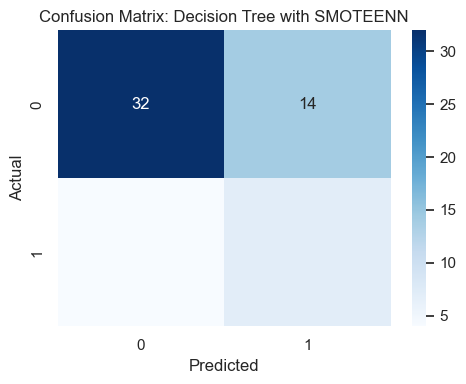

Confusion matrix saved to 'confusion_matrix_Decision Tree_SMOTEENN.png'.



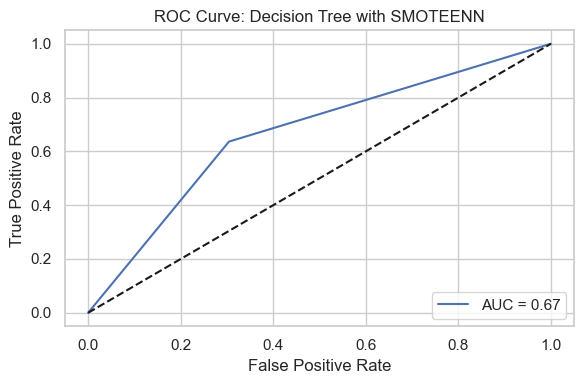

ROC curve saved to 'roc_curve_Decision Tree_SMOTEENN.png'.


Training and tuning Random Forest with SMOTEENN...

Random Forest Performance with SMOTEENN:
Accuracy: 0.67
Precision: 0.32
Recall: 0.64
F1-Score: 0.42
AUC: 0.77


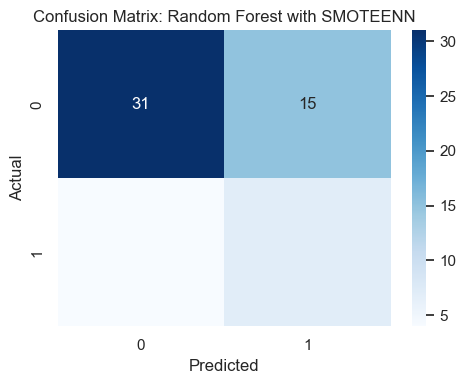

Confusion matrix saved to 'confusion_matrix_Random Forest_SMOTEENN.png'.



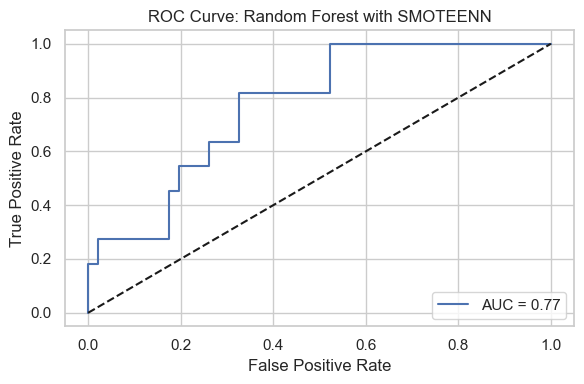

ROC curve saved to 'roc_curve_Random Forest_SMOTEENN.png'.


Training and tuning XGBoost with SMOTEENN...


/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:07:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:07:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:07:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [20:07:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.11/site-packa


XGBoost Performance with SMOTEENN:
Accuracy: 0.70
Precision: 0.35
Recall: 0.64
F1-Score: 0.45
AUC: 0.72


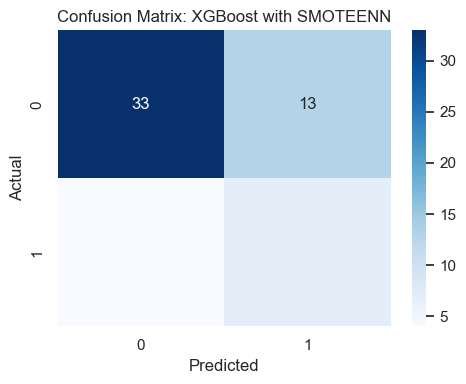

Confusion matrix saved to 'confusion_matrix_XGBoost_SMOTEENN.png'.



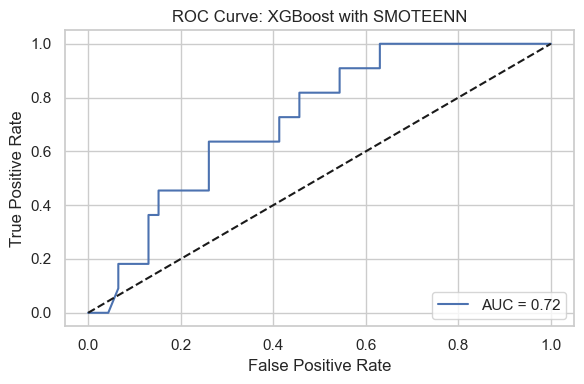

ROC curve saved to 'roc_curve_XGBoost_SMOTEENN.png'.


Training and tuning LightGBM with SMOTEENN...
[LightGBM] [Info] Number of positive: 54, number of negative: 43
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.556701 -> initscore=0.227784
[LightGBM] [Info] Start training from score 0.227784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

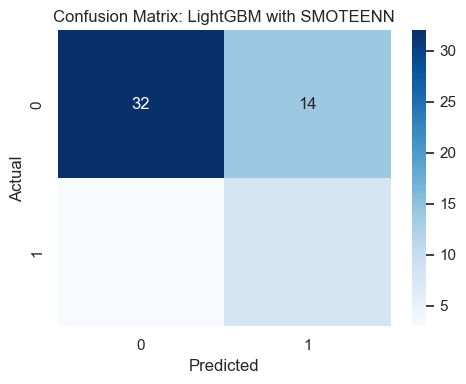

Confusion matrix saved to 'confusion_matrix_LightGBM_SMOTEENN.png'.



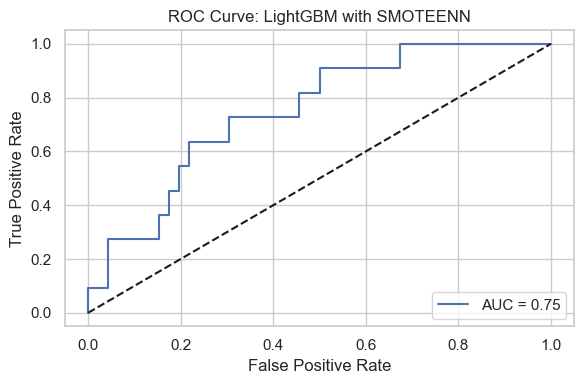

ROC curve saved to 'roc_curve_LightGBM_SMOTEENN.png'.


Training and tuning KNN with SMOTEENN...

KNN Performance with SMOTEENN:
Accuracy: 0.60
Precision: 0.29
Recall: 0.73
F1-Score: 0.41
AUC: 0.74


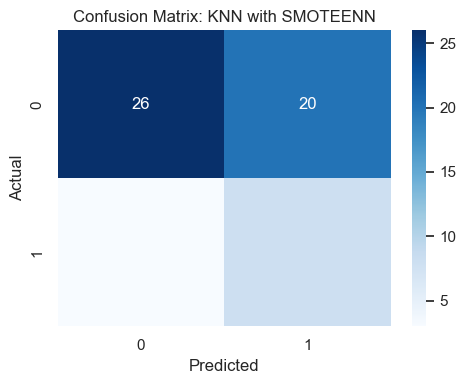

Confusion matrix saved to 'confusion_matrix_KNN_SMOTEENN.png'.



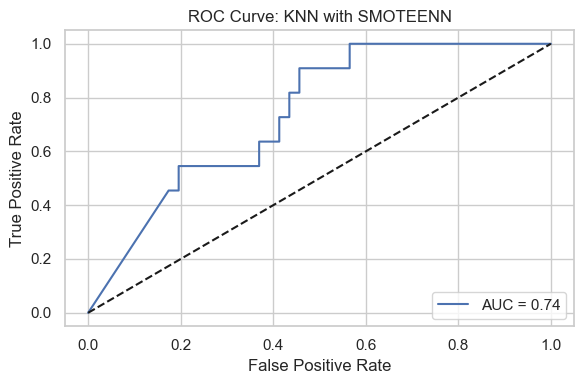

ROC curve saved to 'roc_curve_KNN_SMOTEENN.png'.


Classification Model Performance Comparison (Repayment Risk):
               Resampling                Model  Accuracy  Precision  Recall  \
0           No Resampling  Logistic Regression      0.82       0.67    0.18   
12   Random Over-Sampling  Logistic Regression      0.72       0.38    0.73   
24                 ADASYN  Logistic Regression      0.74       0.40    0.73   
18                  SMOTE  Logistic Regression      0.74       0.40    0.73   
6   Random Under-Sampling  Logistic Regression      0.75       0.42    0.73   
30               SMOTEENN  Logistic Regression      0.67       0.36    0.91   
22                  SMOTE             LightGBM      0.75       0.38    0.45   
11  Random Under-Sampling                  KNN      0.72       0.38    0.73   
26                 ADASYN        Random Forest      0.74       0.36    0.45   
21                  SMOTE              XGBoost      0.74       0.33    0.36   
16   Random Over-S

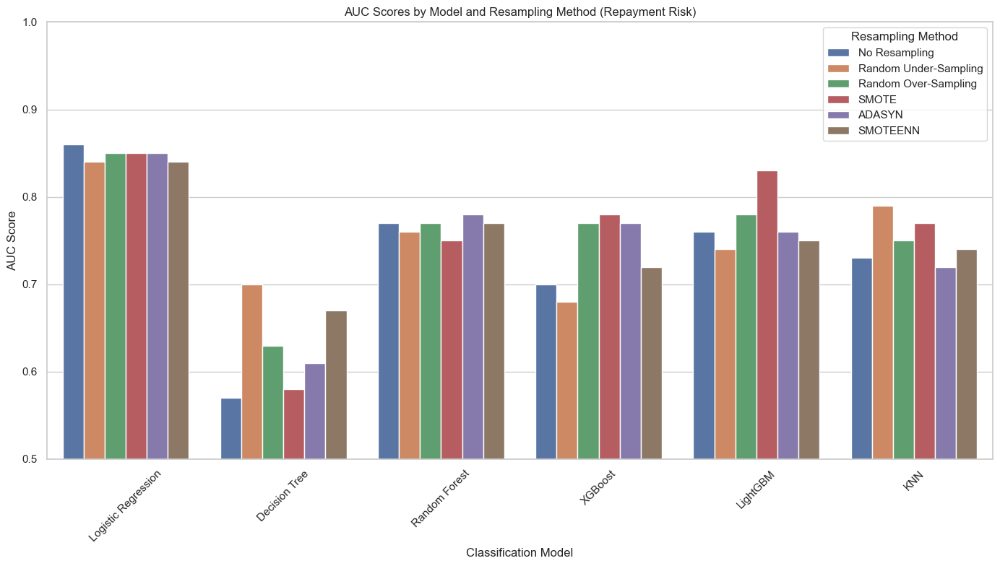

Classification AUC comparison plot saved to 'classification_auc_comparison_repayment.png'.


The best-performing classification model is **Logistic Regression** with **No Resampling** and an AUC of **0.86**.

Best Classification Model saved as 'best_classification_model_Logistic Regression_No Resampling.joblib'



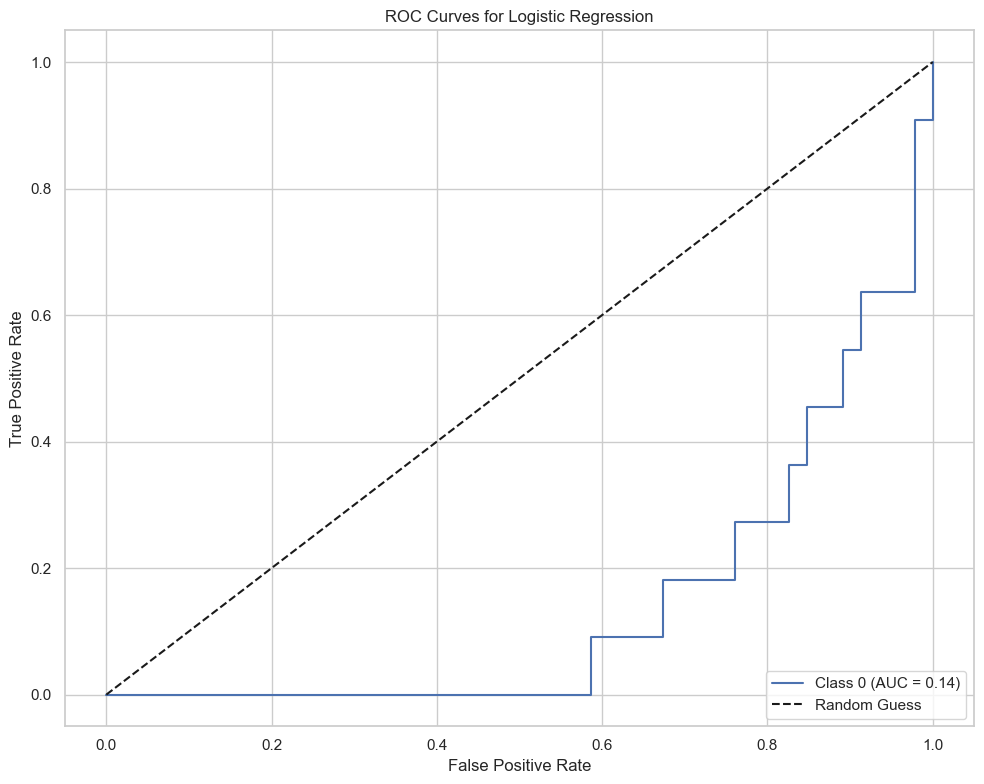

ROC curves plot saved to 'roc_curves_Logistic Regression.png'.



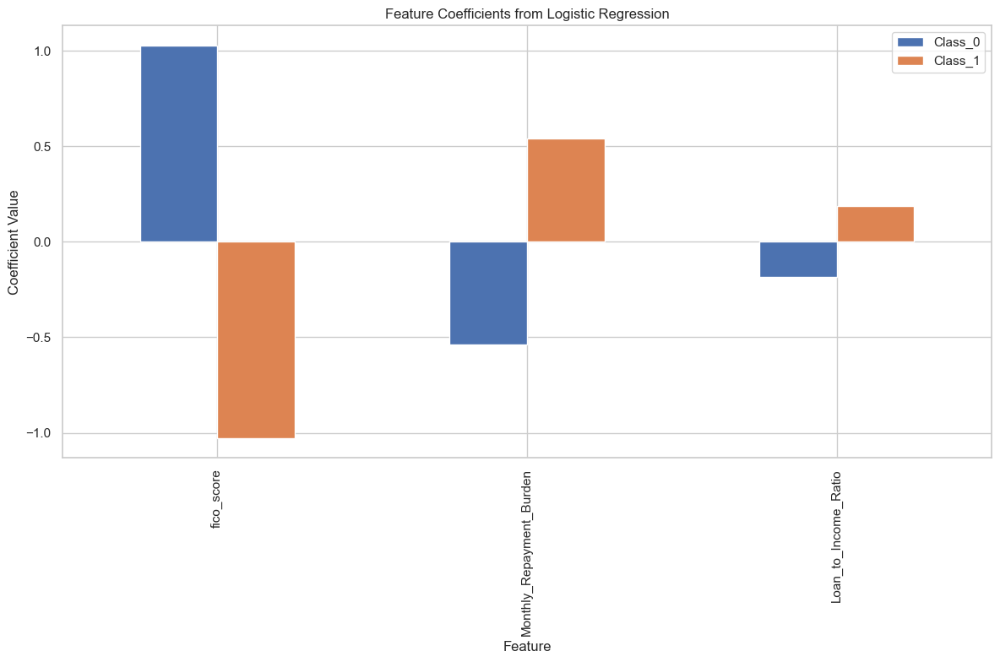

Coefficient plot saved to 'coefficients_logistic_regression_repay.png'.


Performing SHAP analysis for Repayment Risk Model...

Shape of shap_values_repay: (57, 3)
Unique classes in y_cls_repay: [0, 1]
Adjusted class_names_repay: ['Low Risk', 'High Risk']
Number of classes in shap_values_repay: 1

SHAP Summary Plot for High Risk:


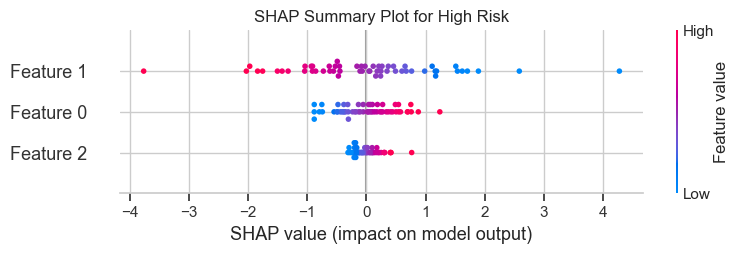

SHAP summary plot saved to 'shap_summary_High_Risk.png'.

df_repayment DataFrame created and saved to 'df_repayment.csv'.

  customer_id True_Repayment_Risk Predicted_Repayment_Risk  \
0       11169           High Risk                 Low Risk   
1       16350            Low Risk                 Low Risk   
2        1477           High Risk                 Low Risk   
3        1409            Low Risk                 Low Risk   
4        1366            Low Risk                 Low Risk   

   Predicted_Repayment_Probability  
0                         0.492037  
1                         0.106309  
2                         0.225356  
3                         0.022656  
4                         0.111161  


In [4]:
# ----------------------------
# 2. Loan Repayment Risk Model (Classification)
# ----------------------------
print("\nTraining Loan Repayment Risk Model (Classification)...\n")

# Define Target Variable
# High Risk: 'Written off', 'Past due'
high_risk_statuses = ['Written off', 'Past due']
full_data['Repayment_Risk'] = full_data['Loan Status'].apply(lambda x: 1 if x in high_risk_statuses else 0)

required_columns = [
    'customer_id', 'Outstanding Principal', 'Qualified / Verified\nIncome', 
    'Loan Amount', 'Outstanding Balance', 'Loan Term (Months)', 'Date of Birth', 'Disbursement Date',
    'Loan Status', 'Interest Rate', 'Gender', 'Province',
    'Residential Status', 'Stated Income on application', 'Aptitude for change Score',
    'Financial Literacy Score', 'Self Assessments', 'Quiz Count', 'Mood Count',
    'Inspiration Count', 'Average total activities per month',
    'Average activities per day', 'fico_score', 'Repayment_Risk'
]

full_data = full_data[required_columns]
full_data = full_data.drop_duplicates()

# Debug: Verify 'Repayment_Risk' Creation
print("\nRepayment_Risk column created in full_data:")
print(full_data[['customer_id', 'Loan Status', 'Repayment_Risk']].head())
print("Number of high-risk loans:", full_data['Repayment_Risk'].sum())

# Feature Engineering for Classification
full_data['Debt_to_Income_Ratio'] = full_data['Outstanding Principal'] / full_data['Qualified / Verified\nIncome']
full_data['Loan_to_Income_Ratio'] = full_data['Loan Amount'] / full_data['Qualified / Verified\nIncome']
full_data['Monthly_Repayment_Burden'] = full_data['Outstanding Balance'] / full_data['Loan Term (Months)']

# Prepare Data for Classification
df_encoded = full_data_encoded.copy()

# Merge 'Repayment_Risk' into df_encoded based on 'customer_id'
df_encoded = df_encoded.merge(full_data[['customer_id', 'Repayment_Risk']], on='customer_id', how='left')

# Debug: Verify 'Repayment_Risk' After Merge
print("\nAfter merging, columns in df_encoded:")
print(df_encoded.columns.tolist())

print("\nSample of Repayment_Risk in df_encoded:")
print(df_encoded[['customer_id', 'Repayment_Risk']].head())

print("\nNumber of missing 'Repayment_Risk':", df_encoded['Repayment_Risk'].isnull().sum())

# Handle Missing Values and Infinite Values
df_encoded.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows where 'Repayment_Risk' is null
df_encoded.dropna(subset=['Repayment_Risk'], inplace=True)

# Debug: Confirm 'Repayment_Risk' Exists
if 'Repayment_Risk' not in df_encoded.columns:
    raise KeyError("'Repayment_Risk' column is missing from df_encoded.")
else:
    print("'Repayment_Risk' column successfully added to df_encoded.")

# Further Debugging: Check for Remaining Missing Values in 'Repayment_Risk'
print("Remaining missing 'Repayment_Risk' values:", df_encoded['Repayment_Risk'].isnull().sum())

# Retain 'customer_id' and necessary features
df_encoded = df_encoded[['customer_id', 'Repayment_Risk','Monthly_Repayment_Burden', 'fico_score',  'Loan_to_Income_Ratio']]
df_encoded = df_encoded.drop_duplicates()

# Define Features and Target
X_cls_repay = df_encoded[['Monthly_Repayment_Burden', 'fico_score',  'Loan_to_Income_Ratio']]
y_cls_repay = df_encoded['Repayment_Risk']

# Identify Numerical and Categorical Columns
numeric_cols_cls_repay = X_cls_repay.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols_cls_repay = X_cls_repay.select_dtypes(include=['object', 'category']).columns.tolist()

# Extract customer_id before splitting
customer_ids_repay = df_encoded['customer_id']

# Split Data into Training and Testing Sets, including customer_ids
X_train_cls_repay, X_test_cls_repay, y_train_cls_repay, y_test_cls_repay, train_ids_repay, test_ids_repay = train_test_split(
    X_cls_repay, y_cls_repay, customer_ids_repay, test_size=0.3, random_state=42, stratify=y_cls_repay
)
print("Data split successfully.\n")

# Preprocessing Pipelines
numeric_transformer_cls_repay = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

if categorical_cols_cls_repay:
    categorical_transformer_cls_repay = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse=False))
    ])
    preprocessor_cls_repay = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer_cls_repay, numeric_cols_cls_repay),
            ('cat', categorical_transformer_cls_repay, categorical_cols_cls_repay)
        ]
    )
else:
    preprocessor_cls_repay = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer_cls_repay, numeric_cols_cls_repay)
        ]
    )

# Apply Preprocessing
X_train_cls_repay_processed = preprocessor_cls_repay.fit_transform(X_train_cls_repay)
X_test_cls_repay_processed = preprocessor_cls_repay.transform(X_test_cls_repay)

# **Save the preprocessor_cls**
joblib.dump(preprocessor_cls_repay, os.path.join(OUTPUT_DIR, 'preprocessor_cls_repay.joblib'))
print("Preprocessor for repayment model saved as 'preprocessor_cls_repay.joblib'\n")

# Define Resampling Methods
resampling_methods_cls_repay = {
    'No Resampling': None,
    'Random Under-Sampling': RandomUnderSampler(random_state=42),
    'Random Over-Sampling': RandomOverSampler(random_state=42),
    'SMOTE': SMOTE(random_state=42),
    'ADASYN': ADASYN(random_state=42),
    'SMOTEENN': SMOTEENN(random_state=42)
}

# Define Classification Models and Hyperparameters
classification_models_repay = {
    'Logistic Regression': {
        'model': LogisticRegression(random_state=42, max_iter=1000),
        'params': {
            'C': [0.01, 0.1, 1, 10],
            'penalty': ['l2'],
            'solver': ['lbfgs']
        }
    },
    'Decision Tree': {
        'model': DecisionTreeClassifier(random_state=42),
        'params': {
            'max_depth': [None, 5, 10],
            'min_samples_split': [2, 5, 10]
        }
    },
    'Random Forest': {
        'model': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [100, 200],
            'max_depth': [None, 5, 10],
            'min_samples_split': [2, 5, 10]
        }
    },
    'XGBoost': {
        'model': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
        'params': {
            'n_estimators': [100, 200],
            'max_depth': [3, 5, 7],
            'learning_rate': [0.01, 0.1, 0.2]
        }
    },
    'LightGBM': {
        'model': lgb.LGBMClassifier(random_state=42),
        'params': {
            'n_estimators': [100, 200],
            'max_depth': [-1, 5, 10],
            'learning_rate': [0.01, 0.1, 0.2]
        }
    },
    'KNN': {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [3, 5, 7],
            'weights': ['uniform', 'distance']
        }
    }
}

# Function to Tune Models Using GridSearchCV
def tune_model_cls(model, param_grid, X_train, y_train):
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='roc_auc',
        cv=5,
        n_jobs=-1
    )
    grid_search.fit(X_train, y_train)
    return grid_search.best_estimator_, grid_search.best_params_

# Dictionary to Store Best Models
best_models_dict_repay = {}

# List to Store Classification Performance Metrics
classification_performance_repay = []

# Iterate Over Each Resampling Method
for resample_name, resampler in resampling_methods_cls_repay.items():
    print(f"\n--- Resampling Method: {resample_name} ---\n")
    
    # Apply Resampling if Not 'No Resampling'
    if resampler is not None:
        X_train_resampled_repay, y_train_resampled_repay = resampler.fit_resample(X_train_cls_repay_processed, y_train_cls_repay)
        print(f"Applied {resample_name}. Resampled training set size: {X_train_resampled_repay.shape[0]}")
    else:
        X_train_resampled_repay, y_train_resampled_repay = X_train_cls_repay_processed, y_train_cls_repay
        print(f"No resampling applied. Training set size remains: {X_train_resampled_repay.shape[0]}")
    
    # Iterate Over Each Classification Model
    for model_name, model_info in classification_models_repay.items():
        model = model_info['model']
        param_grid = model_info['params']
        
        print(f"\nTraining and tuning {model_name} with {resample_name}...")
        best_model_repay, best_params_repay = tune_model_cls(model, param_grid, X_train_resampled_repay, y_train_resampled_repay)
        
        # Store the best model in the dictionary with a unique key
        key_repay = f"{model_name}_{resample_name}"
        best_models_dict_repay[key_repay] = best_model_repay
        
        # Predict on Test Data
        y_pred_repay = best_model_repay.predict(X_test_cls_repay_processed)
        
        # Predict Probabilities for AUC
        if hasattr(best_model_repay, "predict_proba"):
            y_prob_repay = best_model_repay.predict_proba(X_test_cls_repay_processed)[:, 1]
        else:
            y_prob_repay = best_model_repay.decision_function(X_test_cls_repay_processed)
            y_prob_repay = (y_prob_repay - y_prob_repay.min()) / (y_prob_repay.max() - y_prob_repay.min())  # Normalize to [0,1]
        
        # Calculate Metrics
        acc_repay = accuracy_score(y_test_cls_repay, y_pred_repay)
        prec_repay = precision_score(y_test_cls_repay, y_pred_repay, zero_division=0)
        rec_repay = recall_score(y_test_cls_repay, y_pred_repay, zero_division=0)
        f1_repay = f1_score(y_test_cls_repay, y_pred_repay, zero_division=0)
        auc_repay = roc_auc_score(y_test_cls_repay, y_prob_repay)
        
        # Store Metrics
        classification_performance_repay.append({
            'Resampling': resample_name,
            'Model': model_name,
            'Accuracy': round(acc_repay, 2),
            'Precision': round(prec_repay, 2),
            'Recall': round(rec_repay, 2),
            'F1-Score': round(f1_repay, 2),
            'AUC': round(auc_repay, 2),
            'Best_Params': best_params_repay  # Store best hyperparameters
        })
        
        # Print Metrics
        print(f"\n{model_name} Performance with {resample_name}:")
        print(f"Accuracy: {acc_repay:.2f}")
        print(f"Precision: {prec_repay:.2f}")
        print(f"Recall: {rec_repay:.2f}")
        print(f"F1-Score: {f1_repay:.2f}")
        print(f"AUC: {auc_repay:.2f}")
        
        # Optional: Plot Confusion Matrix and ROC Curve
        # Confusion Matrix
        cm_repay = confusion_matrix(y_test_cls_repay, y_pred_repay)
        plt.figure(figsize=(5,4))
        sns.heatmap(cm_repay, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Confusion Matrix: {model_name} with {resample_name}')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.tight_layout()
        plt.savefig(os.path.join(OUTPUT_DIR, f'confusion_matrix_{model_name}_{resample_name}.png'))
        plt.show()
        print(f"Confusion matrix saved to 'confusion_matrix_{model_name}_{resample_name}.png'.\n")
        
        # ROC Curve
        fpr_repay, tpr_repay, thresholds_repay = roc_curve(y_test_cls_repay, y_prob_repay)
        plt.figure(figsize=(6,4))
        plt.plot(fpr_repay, tpr_repay, label=f'AUC = {auc_repay:.2f}')
        plt.plot([0,1], [0,1], 'k--')
        plt.title(f'ROC Curve: {model_name} with {resample_name}')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend(loc='lower right')
        plt.tight_layout()
        plt.savefig(os.path.join(OUTPUT_DIR, f'roc_curve_{model_name}_{resample_name}.png'))
        plt.show()
        print(f"ROC curve saved to 'roc_curve_{model_name}_{resample_name}.png'.\n")

# Convert Classification Performance to DataFrame
classification_performance_repay_df = pd.DataFrame(classification_performance_repay)
print("\nClassification Model Performance Comparison (Repayment Risk):")
print(classification_performance_repay_df.sort_values(by='AUC', ascending=False))

# Save Classification Performance
classification_performance_repay_df.to_csv(os.path.join(OUTPUT_DIR, 'classification_performance_repayment.csv'), index=False)
print("\nClassification performance metrics saved to 'classification_performance_repayment.csv'.\n")

# Visualize Classification Performance (AUC Scores)
plt.figure(figsize=(14, 8))
sns.barplot(
    data=classification_performance_repay_df,
    x='Model',
    y='AUC',
    hue='Resampling'
)
plt.title('AUC Scores by Model and Resampling Method (Repayment Risk)')
plt.xlabel('Classification Model')
plt.ylabel('AUC Score')
plt.legend(title='Resampling Method')
plt.xticks(rotation=45)
plt.ylim(0.5, 1.0)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'classification_auc_comparison_repayment.png'))
plt.show()
print("Classification AUC comparison plot saved to 'classification_auc_comparison_repayment.png'.\n")

# Identify Best Classification Model Based on AUC
best_performance_repay = classification_performance_repay_df.loc[classification_performance_repay_df['AUC'].idxmax()]
best_model_name_repay = best_performance_repay['Model']
best_resampling_repay = best_performance_repay['Resampling']
best_auc_repay = best_performance_repay['AUC']

print(f"\nThe best-performing classification model is **{best_model_name_repay}** with **{best_resampling_repay}** and an AUC of **{best_auc_repay}**.\n")

# Retrieve and Save the Best Classification Model
best_model_key_repay = f"{best_model_name_repay}_{best_resampling_repay}"
best_classification_model_repay = best_models_dict_repay.get(best_model_key_repay)

if best_classification_model_repay is not None:
    joblib.dump(best_classification_model_repay, os.path.join(OUTPUT_DIR, f'best_classification_model_{best_model_key_repay}.joblib'))
    print(f"Best Classification Model saved as 'best_classification_model_{best_model_key_repay}.joblib'\n")
else:
    print(f"Error: Best model '{best_model_key_repay}' not found in the trained models dictionary.\n")

# Plot ROC Curves for Best Model
# Binarize the output
classes_repay = [0, 1]
y_test_binarized_repay = label_binarize(y_test_cls_repay, classes=classes_repay)
n_classes_repay = y_test_binarized_repay.shape[1]

# Use appropriate features
if best_model_name_repay in ['Logistic Regression', 'SVM', 'KNN', 'Neural Network']:
    X_te_repay = X_test_cls_repay_processed
else:
    X_te_repay = X_test_cls_repay

y_score_repay = best_classification_model_repay.predict_proba(X_te_repay)

# Compute ROC curve and ROC area for each class
fpr_repay_best = dict()
tpr_repay_best = dict()
roc_auc_repay_best = dict()

plt.figure(figsize=(10, 8))

for i in range(n_classes_repay):
    fpr_repay_best[i], tpr_repay_best[i], _ = roc_curve(y_test_binarized_repay[:, i], y_score_repay[:, i])
    roc_auc_repay_best[i] = auc(fpr_repay_best[i], tpr_repay_best[i])
    plt.plot(fpr_repay_best[i], tpr_repay_best[i],
             label=f'Class {classes_repay[i]} (AUC = {roc_auc_repay_best[i]:.2f})')

# Plotting
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curves for {best_model_name_repay}')
plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f'roc_curves_{best_model_name_repay}.png'))
plt.show()
print(f"ROC curves plot saved to 'roc_curves_{best_model_name_repay}.png'.\n")

# Feature Importance for Best Classification Model
if best_model_name_repay in ['Random Forest', 'XGBoost', 'LightGBM', 'Decision Tree']:
    importances_repay = best_classification_model_repay.feature_importances_
    feature_names_repay = ['Monthly_Repayment_Burden', 'fico_score', 'Loan_to_Income_Ratio']
    feature_importance_df_repay = pd.DataFrame({
        'Feature': feature_names_repay,
        'Importance': importances_repay
    }).sort_values(by='Importance', ascending=False)

    # Plot Feature Importances
    plt.figure(figsize=(12, 8))
    sns.barplot(data=feature_importance_df_repay, x='Importance', y='Feature', palette='magma')
    plt.title(f'Feature Importances from {best_model_name_repay}')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f'feature_importance_{best_model_name_repay}.png'))
    plt.show()
    print(f"Feature importance plot saved to 'feature_importance_{best_model_name_repay}.png'.\n")
elif best_model_name_repay == 'Logistic Regression':
    coefficients_repay = best_classification_model_repay.coef_
    feature_names_repay = ['Monthly_Repayment_Burden', 'fico_score', 'Loan_to_Income_Ratio']
    
    num_classes_repay = len(best_classification_model_repay.classes_)
    
    if num_classes_repay == 2:
        # Binary classification
        coef_df_repay = pd.DataFrame(coefficients_repay.T, 
                                     index=feature_names_repay, 
                                     columns=['Class_1'])
        coef_df_repay['Class_0'] = -coef_df_repay['Class_1']
    else:
        # Multiclass classification
        coef_df_repay = pd.DataFrame(coefficients_repay.T, 
                                     index=feature_names_repay, 
                                     columns=[f'Class_{cls}' for cls in best_classification_model_repay.classes_])
    
    # Calculate Importance based on absolute maximum coefficients across classes
    if num_classes_repay == 2:
        coef_df_repay['Importance'] = coef_df_repay[['Class_0', 'Class_1']].abs().max(axis=1)
    else:
        coef_df_repay['Importance'] = coef_df_repay.abs().max(axis=1)
    coef_df_repay = coef_df_repay.sort_values(by='Importance', ascending=False)
    
    # Determine classes to plot
    if num_classes_repay == 2:
        classes_to_plot_repay = ['Class_0', 'Class_1']
    else:
        classes_to_plot_repay = [f'Class_{cls}' for cls in best_classification_model_repay.classes_]
    
    # Plot Coefficients for each class
    coef_df_repay[classes_to_plot_repay].plot(kind='bar', figsize=(12, 8))
    plt.title('Feature Coefficients from Logistic Regression')
    plt.xlabel('Feature')
    plt.ylabel('Coefficient Value')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f'coefficients_logistic_regression_repay.png'))
    plt.show()
    print("Coefficient plot saved to 'coefficients_logistic_regression_repay.png'.\n")
else:
    print(f"{best_model_name_repay} does not provide straightforward feature importances.\n")

# ----------------------------
# SHAP Analysis for Repayment Risk Model
# ----------------------------
print("\nPerforming SHAP analysis for Repayment Risk Model...\n")

# Prepare data for SHAP
if best_model_name_repay in ['Logistic Regression', 'SVM', 'KNN', 'Neural Network']:
    X_shap_repay = X_test_cls_repay_processed
else:
    X_shap_repay = X_test_cls_repay

# Use the unified SHAP Explainer
explainer_repay = shap.Explainer(best_classification_model_repay, X_shap_repay)
shap_values_repay = explainer_repay(X_shap_repay)

# Determine the shape of shap_values_repay
print(f"Shape of shap_values_repay: {shap_values_repay.shape}")

# Check unique classes in y_cls_repay
unique_classes_repay = sorted(y_cls_repay.unique())
print(f"Unique classes in y_cls_repay: {unique_classes_repay}")

# Create class names based on unique classes
class_mapping_repay = {0: 'Low Risk', 1: 'High Risk'}
class_names_repay = [class_mapping_repay[cls] for cls in unique_classes_repay]
print(f"Adjusted class_names_repay: {class_names_repay}")

# Determine number of classes in SHAP values
if len(shap_values_repay.values.shape) == 2:
    # Binary classification, shap_values_repay has shape (n_samples, n_features)
    n_classes_shap_repay = 1
elif len(shap_values_repay.values.shape) == 3:
    n_classes_shap_repay = shap_values_repay.values.shape[2]
else:
    raise ValueError("Unexpected shape for shap_values_repay")

print(f"Number of classes in shap_values_repay: {n_classes_shap_repay}")

# Iterate over actual classes
for class_idx in range(n_classes_shap_repay):
    if n_classes_shap_repay == 1 and class_idx == 0:
        class_name = 'High Risk'  # Assuming shap provides shap values for the positive class
    elif n_classes_shap_repay > 1:
        if class_idx >= len(class_names_repay):
            print(f"Class index {class_idx} exceeds class_names length; skipping.")
            continue
        class_name = class_names_repay[class_idx]
    else:
        print(f"Unexpected number of classes: {n_classes_shap_repay}")
        continue

    print(f"\nSHAP Summary Plot for {class_name}:")
    
    # Extract SHAP values for the class
    if n_classes_shap_repay == 1:
        shap_values_class_repay = shap_values_repay
    else:
        shap_values_class_repay = shap_values_repay[..., class_idx]
    
    # Generate the summary plot
    shap.summary_plot(shap_values_class_repay, show=False)
    plt.title(f'SHAP Summary Plot for {class_name}')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f'shap_summary_{class_name.replace(" ", "_")}.png'))
    plt.show()
    print(f"SHAP summary plot saved to 'shap_summary_{class_name.replace(' ', '_')}.png'.\n")

# ----------------------------
# Creating df_repayment DataFrame
# ----------------------------

# Get predicted labels and probabilities from the best model
if best_model_name_repay in ['Logistic Regression', 'SVM', 'KNN', 'Neural Network']:
    X_te_repay_final = X_test_cls_repay_processed
else:
    X_te_repay_final = X_test_cls_repay

y_pred_repay = best_classification_model_repay.predict(X_te_repay_final)
y_pred_proba_repay = best_classification_model_repay.predict_proba(X_te_repay_final)[:, 1]  # Probability of class '1'

# Create df_repayment DataFrame
df_repayment = pd.DataFrame({
    'customer_id': test_ids_repay.values,
    'True_Repayment_Risk': y_test_cls_repay.values,
    'Predicted_Repayment_Risk': y_pred_repay,
    'Predicted_Repayment_Probability': y_pred_proba_repay
})

# Optionally, map the numerical labels to categorical labels
repayment_risk_mapping = {0: 'Low Risk', 1: 'High Risk'}
df_repayment['True_Repayment_Risk'] = df_repayment['True_Repayment_Risk'].map(repayment_risk_mapping)
df_repayment['Predicted_Repayment_Risk'] = df_repayment['Predicted_Repayment_Risk'].map(repayment_risk_mapping)

# Save df_repayment to CSV
df_repayment.to_csv(os.path.join(OUTPUT_DIR, 'df_repayment.csv'), index=False)
print("df_repayment DataFrame created and saved to 'df_repayment.csv'.\n")

# Display the first few rows
print(df_repayment.head())

Checking for missing values in cis_data:
customer_id                         0
True_Engagement_Level               0
Predicted_Engagement_Level          0
Predicted_Engagement_Probability    0
True_Repayment_Risk                 0
Predicted_Repayment_Risk            0
Predicted_Repayment_Probability     0
dtype: int64 

After handling missing values:
customer_id                         0
True_Engagement_Level               0
Predicted_Engagement_Level          0
Predicted_Engagement_Probability    0
True_Repayment_Risk                 0
Predicted_Repayment_Risk            0
Predicted_Repayment_Probability     0
dtype: int64 

CIS and CIS_Segment Distribution:
    CIS CIS_Segment
0  1.00   Segment C
1  1.00   Segment C
2  1.45   Segment B
3  1.00   Segment C
4  1.00   Segment C

CIS_Segment Value Counts:
CIS_Segment
Segment C    84
Segment B    56
Segment A     4
Name: count, dtype: int64 

Adjusted CIS Calculation Completed and saved to 'output_cis/Customer_Index_Score_Adjusted.csv'.



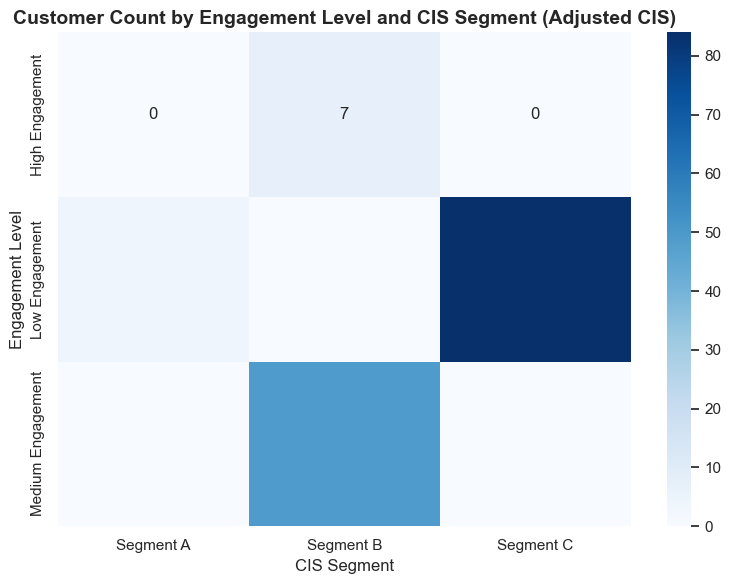

Adjusted CIS heatmap plot saved to 'cis_heatmap_adjusted.png'.

Number of Early Warning Customers (Repayment Risk Probability >= 0.8): 2
    customer_id  Predicted_Repayment_Probability
121       17048                         0.947121
122       17048                         0.947121 

Early Warning Customers saved to 'output_cis/Early_Warning_Customers.csv'.

All data integrity checks passed successfully.



In [5]:
# ----------------------------
# 3. Customer Index Score (CIS) Calculation
# ----------------------------

cis_data = pd.merge(df_engagement, df_repayment, on='customer_id', how='inner')

# Check for missing values
print("Checking for missing values in cis_data:")
print(cis_data.isnull().sum(), "\n")

# Handle missing values
# For categorical columns, fill with mode
categorical_cols = ['Engagement_Level', 'True_Engagement_Level', 'Predicted_Engagement_Level',
                    'True_Repayment_Risk', 'Predicted_Repayment_Risk', 'Repayment_Risk_Level', 'CIS_Segment']
for col in categorical_cols:
    if col in cis_data.columns:
        cis_data[col].fillna(cis_data[col].mode()[0], inplace=True)

# For numerical columns, fill with mean or median
numerical_cols = ['Predicted_Repayment_Probability', 'CIS']
for col in numerical_cols:
    if col in cis_data.columns:
        cis_data[col].fillna(cis_data[col].mean(), inplace=True)

# Verify filling
print("After handling missing values:")
print(cis_data.isnull().sum(), "\n")

# Define numeric scores for categorical variables
engagement_score_mapping = {'Low Engagement': 1, 'Medium Engagement': 2, 'High Engagement': 3}
repayment_risk_mapping = {'Low Risk': 1, 'Medium Risk': 2, 'High Risk': 3}

# Map categorical columns to numeric scores
cis_data['Engagement_Score'] = cis_data['Predicted_Engagement_Level'].map(engagement_score_mapping)
cis_data['Repayment_Risk_Score'] = cis_data['Predicted_Repayment_Risk'].map(repayment_risk_mapping)

# Define CIS as a weighted combination
# Example weights: Engagement = 0.4, Repayment Risk = 0.6
cis_data['CIS'] = (cis_data['Engagement_Score'] * 0.45) + (cis_data['Repayment_Risk_Score'] * 0.55)

# Define CIS Segments based on CIS score
def define_cis_segment(cis_score):
    if cis_score >= 2.1:
        return 'Segment A'
    elif cis_score >= 1.05:
        return 'Segment B'
    else:
        return 'Segment C'

cis_data['CIS_Segment'] = cis_data['CIS'].apply(define_cis_segment)

# Verify CIS and CIS_Segment
print("CIS and CIS_Segment Distribution:")
print(cis_data[['CIS', 'CIS_Segment']].head())
print("\nCIS_Segment Value Counts:")
print(cis_data['CIS_Segment'].value_counts(), "\n")

# Save CIS Data
cis_output_path = os.path.join(OUTPUT_DIR, 'Customer_Index_Score_Adjusted.csv')
cis_data.to_csv(cis_output_path, index=False)
print(f"Adjusted CIS Calculation Completed and saved to '{cis_output_path}'.\n")

# Create Pivot Table
pivot_table_cis = pd.pivot_table(
    cis_data, 
    index='Predicted_Engagement_Level', 
    columns='CIS_Segment', 
    aggfunc='size',
    fill_value=0
).astype(int)

print("Pivot Table for Heatmap:")
print(pivot_table_cis, "\n")

# Plot Heatmap
plt.figure(figsize=(8,6))
sns.heatmap(pivot_table_cis, annot=True, fmt='d', cmap='Blues')
plt.title('Customer Count by Engagement Level and CIS Segment (Adjusted CIS)', fontsize=14, fontweight='bold')
plt.xlabel('CIS Segment', fontsize=12)
plt.ylabel('Engagement Level', fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'cis_heatmap_adjusted.png'))
plt.show()
print("Adjusted CIS heatmap plot saved to 'cis_heatmap_adjusted.png'.\n")

# Define High-Risk Threshold
high_risk_threshold = 0.8  # Adjust as per business requirements

# Identify Early Warning Customers
early_warning_customers = cis_data[cis_data['Predicted_Repayment_Probability'] >= high_risk_threshold]

print(f"Number of Early Warning Customers (Repayment Risk Probability >= {high_risk_threshold}): {early_warning_customers.shape[0]}")
print(early_warning_customers[['customer_id', 'Predicted_Repayment_Probability']].head(), "\n")

# Save Early Warning Customers
early_warning_output_path = os.path.join(OUTPUT_DIR, 'Early_Warning_Customers.csv')
early_warning_customers.to_csv(early_warning_output_path, index=False)
print(f"Early Warning Customers saved to '{early_warning_output_path}'.\n")

# Assert that 'customer_id' is unique in both DataFrames
# assert df_engagement['customer_id'].is_unique, "Duplicate customer_ids found in df_engagement."
assert df_repayment['customer_id'].is_unique, "Duplicate customer_ids found in df_repayment."

# Ensure no missing customer_ids after merge
assert not cis_data['customer_id'].isnull().any(), "Missing customer_ids in cis_data after merge."

# Validate that all required columns exist
required_columns = [
    'customer_id', 'True_Engagement_Level', 'Predicted_Engagement_Level',
    'Predicted_Engagement_Probability', 'True_Repayment_Risk', 'Predicted_Repayment_Risk',
    'Predicted_Repayment_Probability', 'CIS', 'CIS_Segment',
    'Engagement_Score', 'Repayment_Risk_Score'
]

for col in required_columns:
    assert col in cis_data.columns, f"Required column '{col}' is missing in cis_data."

print("All data integrity checks passed successfully.\n")

